# **Initialisation**

In [1]:
import torch
import torchvision.transforms as T
import torchvision.transforms.functional as TF
import torch.nn as nn
import torchvision
from torchvision import models
from torchvision.models import resnet50, ResNet50_Weights

import deepgaze_pytorch

import hydra
from hydra import compose, initialize
from omegaconf import OmegaConf

from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor
from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator

from PIL import Image
import numpy as np
from scipy.misc import face
from scipy.ndimage import zoom
from scipy.special import logsumexp
import matplotlib.pyplot as plt
import cv2

import os

C:\Users\matth\Programming\Research\2025\CVPR\SaRaCVPR\sam2\sam2\modeling\sam\transformer.py:23: UserWarning: Flash Attention is disabled as it requires a GPU with Ampere (8.0) CUDA capability.
  OLD_GPU, USE_FLASH_ATTN, MATH_KERNEL_ON = get_sdpa_settings()


In [2]:
CONFIG_PATH = "./sam2/sam2/configs/sam2.1/"
YAML_CONFIG = "sam2.1_hiera_t.yaml"

FULL_PATH = os.path.join(CONFIG_PATH, YAML_CONFIG)

TEST_IMG_PATH = "./test_images/"
images = os.listdir(TEST_IMG_PATH)
images = [f"{TEST_IMG_PATH}{img}" for img in images]

In [3]:
initialize(version_base=None, config_path=CONFIG_PATH, job_name="test_app")
cfg = compose(config_name=YAML_CONFIG, overrides=[])

In [4]:
# select the device for computation
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"using device: {device}")

if device.type == "cuda":
    # use bfloat16 for the entire notebook
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    # turn on tfloat32 for Ampere GPUs (https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices)
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True
elif device.type == "mps":
    print(
        "\nSupport for MPS devices is preliminary. SAM 2 is trained with CUDA and might "
        "give numerically different outputs and sometimes degraded performance on MPS. "
        "See e.g. https://github.com/pytorch/pytorch/issues/84936 for a discussion."
    )

using device: cuda


In [5]:
checkpoint = "./sam2/checkpoints/sam2.1_hiera_tiny.pt"
model_cfg = YAML_CONFIG
# predictor = SAM2ImagePredictor(build_sam2(YAML_CONFIG, checkpoint))
sam2 = build_sam2(model_cfg, checkpoint, device=device, apply_postprocessing=False)

In [6]:
def show_mask(mask, ax, random_color=False, borders = True):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask = mask.astype(np.uint8)
    mask_image =  mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    if borders:
        import cv2
        contours, _ = cv2.findContours(mask,cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) 
        # Try to smooth contours
        contours = [cv2.approxPolyDP(contour, epsilon=0.01, closed=True) for contour in contours]
        mask_image = cv2.drawContours(mask_image, contours, -1, (1, 1, 1, 0.5), thickness=2) 
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))    

def show_masks(image, masks, scores, point_coords=None, box_coords=None, input_labels=None, borders=True):
    for i, (mask, score) in enumerate(zip(masks, scores)):
        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        show_mask(mask, plt.gca(), borders=borders)
        if point_coords is not None:
            assert input_labels is not None
            show_points(point_coords, input_labels, plt.gca())
        if box_coords is not None:
            # boxes
            show_box(box_coords, plt.gca())
        if len(scores) > 1:
            plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
        plt.axis('off')
        plt.show()

def show_anns(anns, borders=True):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:, :, 3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.5]])
        img[m] = color_mask 
        if borders:
            import cv2
            contours, _ = cv2.findContours(m.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) 
            # Try to smooth contours
            contours = [cv2.approxPolyDP(contour, epsilon=0.01, closed=True) for contour in contours]
            cv2.drawContours(img, contours, -1, (0, 0, 1, 0.4), thickness=1) 

    ax.imshow(img)

# **Backbone**

In [7]:
class SaliencyModel(nn.Module):
    def __init__(self, num_channels=1):
        super(SaliencyModel, self).__init__()
        # Load ResNet backbone (without the final classification layer)
        resnet = models.resnet50(weights=ResNet50_Weights.IMAGENET1K_V2)
        self.backbone = nn.Sequential(*list(resnet.children())[:-2])
        
        # Add layers to convert backbone features into a saliency map
        class SelfAttention(nn.Module):
            def __init__(self, in_channels):
                super(SelfAttention, self).__init__()
                self.query = nn.Conv2d(in_channels, in_channels // 8, kernel_size=1)
                self.key = nn.Conv2d(in_channels, in_channels // 8, kernel_size=1)
                self.value = nn.Conv2d(in_channels, in_channels, kernel_size=1)
                self.gamma = nn.Parameter(torch.zeros(1))

            def forward(self, x):
                # ... (implementation of self-attention)
                return x

        self.saliency_head = nn.Sequential(
            nn.Conv2d(2048, 512, kernel_size=1, stride=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1, dilation=2),  # Dilated convolution
            nn.ReLU(inplace=True),
            SelfAttention(512),  # Self-attention
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 1, kernel_size=1, stride=1)
        )
    
    def forward(self, x):
        features = self.backbone(x)  # Get features from ResNet
        saliency_map = self.saliency_head(features)  # Generate saliency map
        return saliency_map

# **Model Augmentation**

In [8]:
class SaliencySegmentationModel(nn.Module):
    def __init__(self, resnet_backbone, sam_model):
        super(SaliencySegmentationModel, self).__init__()
        self.saliency_model = resnet_backbone
        self.sam_model = sam_model  # Pre-trained SAM2 model
    
    def forward(self, x, img):
        # Get saliency map from ResNet backbone

        saliency_map = self.saliency_model(x)

        
        # Get segmentation masks from SAM2
        # segments = self.sam_model(x)
        # img_numpy = x.squeeze(0).permute(1, 2, 0).cpu().numpy()

        mask_generator = SAM2AutomaticMaskGenerator(
            model=sam2,
            # points_per_side=16,
            # points_per_batch=16,
            # pred_iou_thresh=0.7,
            # stability_score_thresh=0.92,
            # stability_score_offset=0.7,
            # crop_n_layers=1,
            # box_nms_thresh=0.7,
            # crop_n_points_downscale_factor=2,
            min_mask_region_area=200.0,
            # use_m2m=True,
        )

        with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
            img = np.array(img.convert("RGB"))
            masks = mask_generator.generate(img)

        segments = masks
        
        # Combine saliency map with segment masks for ranking
        return saliency_map, segments

# **Implementation**

In [9]:
img = Image.open(images[1]).convert("RGB")
img_np = np.array(img)

normalize = T.Normalize(
    mean=[0.485, 0.456, 0.406],
    std=[0.229, 0.224, 0.225]
)

inv_normalize = T.Normalize(
    mean=[-0.485/0.229, -0.456/0.224, -0.406/0.255],
    std=[1/0.229, 1/0.224, 1/0.255]
)                         

transform = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor(),
    normalize,          
])

img_tensor = transform(img).unsqueeze(0).to(device)
img_tensor.requires_grad = True

# **Evaluation**

In [11]:
GT_PATH = './ASSR/gt/test/'
PRED_PATH = './SCRN/saliency_maps/ASSR/'

In [174]:
from scipy.stats import spearmanr
from scipy.stats import pearsonr
from tqdm import tqdm  # Import TQDM

def calculate_mae(pred, gt):
    return np.mean(np.abs(pred - gt))

# Calculate SOR using Spearman's Rank Correlation
def calculate_sor(pred, gt):
    # Perform erosion on pred
    kernel = np.ones((10, 10), np.uint8)
    plt.figure()
    plt.subplot(121)
    plt.imshow(pred)
    pred = cv2.erode(pred, kernel, iterations=2)
    plt.subplot(122)
    plt.imshow(pred)
    plt.show()

    # Find object blobs using cv2
    _, pred_objects = cv2.connectedComponents(pred.astype(np.uint8))

    # Extract all unique pixel values in gt
    unique_gt = np.unique(gt)

    # Remove 0
    unique_gt = unique_gt[unique_gt != 0]

    # Create a mapping from pixel value to object number. Rank them max to 1, with 1 being highest rank
    gt_objects = np.zeros_like(gt)
    rank = len(unique_gt)
    for i, val in enumerate(unique_gt):
        gt_objects[gt == val] = rank
        rank -= 1

    gt_ranks = []

    # Mapping from object number to rank
    for i in range(1, np.max(gt_objects) + 1):
        gt_ranks.append(np.mean(gt_objects == i))

    # Get indices which would sort the array
    sorted_gt_ranks = np.argsort(gt_ranks) + 1

        

    # Find 1:1 object matches with > 0.5 IoU
    matches = {}

    for i in range(1, np.max(pred_objects) + 1):
        pred_mask = pred_objects == i
        pred_mask = pred_mask.astype(np.uint8)

        for j in range(1, np.max(gt_objects) + 1):
            gt_mask = gt_objects == j
            gt_mask = gt_mask.astype(np.uint8)

            intersection = np.sum(pred_mask & gt_mask)
            union = np.sum(pred_mask | gt_mask)

            iou = intersection / union

            if iou > 0.1:
                matches[i] = {}
                matches[i]["iou"] = iou
                matches[i]["pred_saliency"] = np.mean(pred_objects == i)
                # Get GT rank from match in sorted_gt_ranks
                matches[i]["gt_rank"] = sorted_gt_ranks[j - 1]



    # Sort matches based on avg saliency, then separate into integers
    sorted_matches = sorted(matches.items(), key=lambda x: x[1]["pred_saliency"], reverse=True)
    rank = 1

    for i, match in enumerate(sorted_matches):
        matches[match[0]]["pred_rank"] = rank
        rank += 1

    pred_ranks_final = []
    gt_ranks_final = []

    # print(f'GT ranks: {sorted_gt_ranks}')
    for k, v in matches.items():
        # print(f'{k} -> {v}')
        pred_rank = v["pred_rank"]
        gt_rank = v["gt_rank"]

        pred_ranks_final.append(pred_rank)
        gt_ranks_final.append(gt_rank)

    if len(pred_ranks_final) == 0:
        return None
    
    sprc = spearmanr(pred_ranks_final, gt_ranks_final).correlation

    # Normalise to range [0, 1]
    sprc = (sprc + 1) / 2

    plt.figure()
    plt.subplot(121)
    plt.imshow(pred)
    plt.title('Predicted')
    plt.subplot(122)
    plt.imshow(gt)
    plt.title('Ground Truth')
    plt.show()

    print(pred_ranks_final)
    print(gt_ranks_final)
    print(f'SPRC: {sprc}')

    return sprc


def calculate_sa_sor(pred, gt):
    pass


Processing Images:   0%|          | 0/500 [00:00<?, ?it/s]

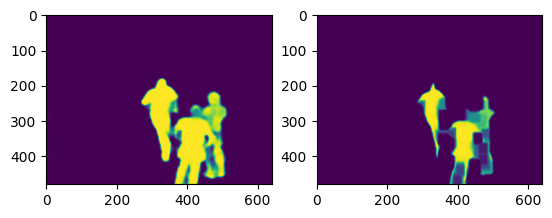

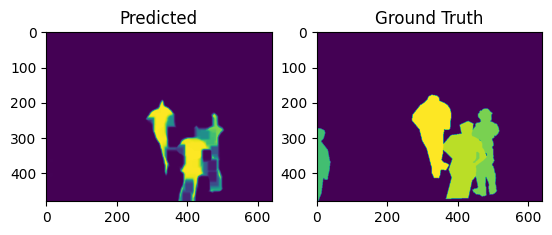

Processing Images:   0%|          | 1/500 [00:00<03:28,  2.40it/s]

[1, 2]
[1, 2]
SPRC: 1.0


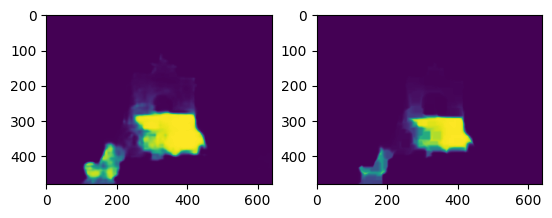

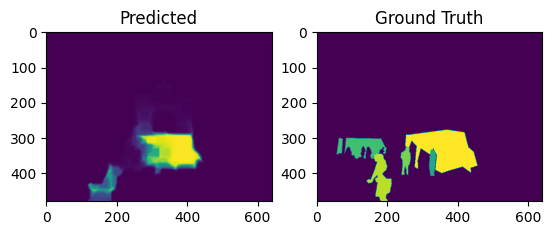

Processing Images:   0%|          | 2/500 [00:00<03:36,  2.30it/s]

[1]
[5]
SPRC: nan


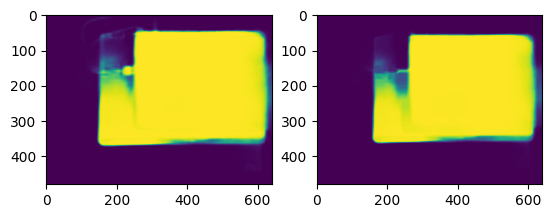

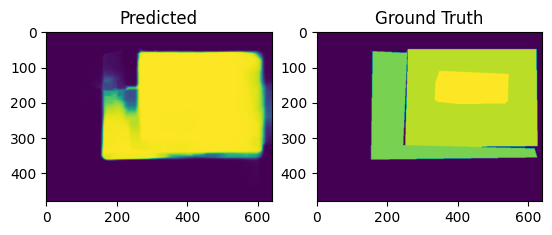

Processing Images:   1%|          | 3/500 [00:01<03:34,  2.31it/s]

[1]
[2]
SPRC: nan


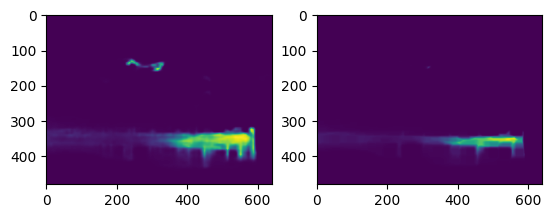

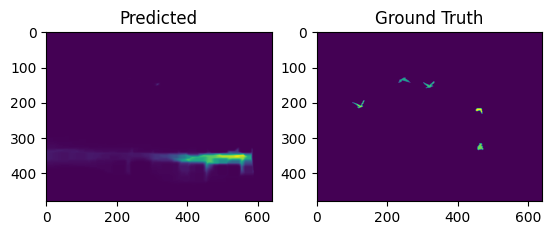

Processing Images:   1%|          | 4/500 [00:01<03:26,  2.40it/s]

[1]
[4]
SPRC: nan


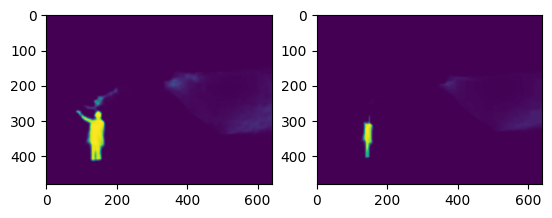

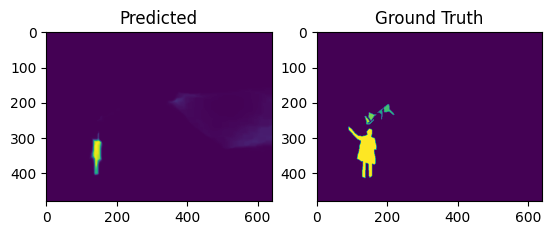

Processing Images:   1%|          | 5/500 [00:02<03:32,  2.33it/s]

[1]
[5]
SPRC: nan


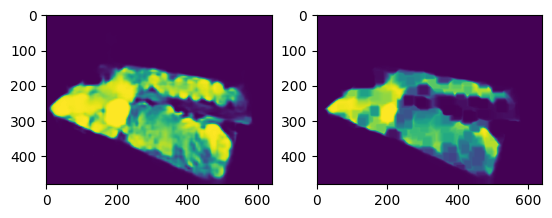

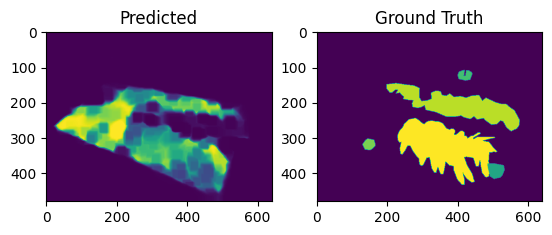

Processing Images:   1%|          | 6/500 [00:02<03:39,  2.25it/s]

[1]
[4]
SPRC: nan


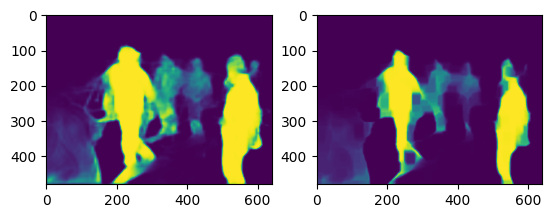

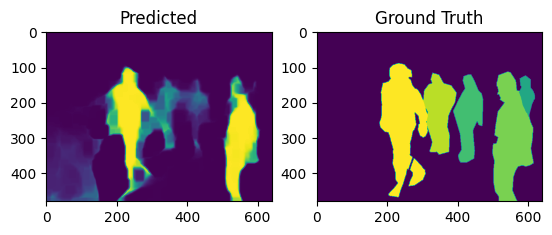

Processing Images:   1%|▏         | 7/500 [00:03<03:36,  2.28it/s]

[1, 2]
[3, 2]
SPRC: 5.551115123125783e-17


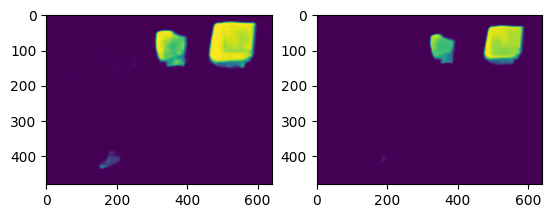

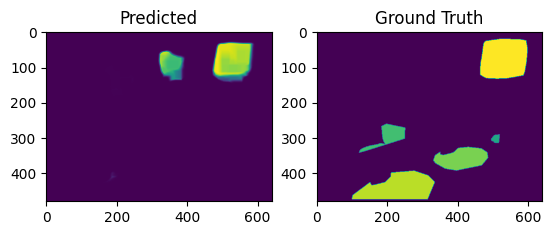

Processing Images:   2%|▏         | 8/500 [00:03<03:31,  2.32it/s]

[1]
[5]
SPRC: nan


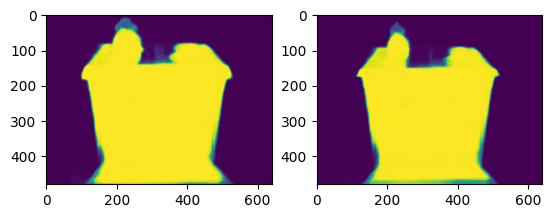

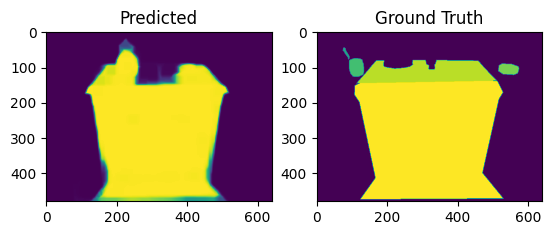

Processing Images:   2%|▏         | 9/500 [00:03<03:24,  2.40it/s]

[1]
[3]
SPRC: nan


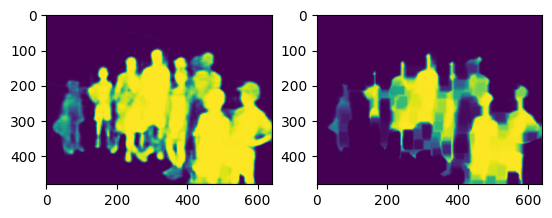

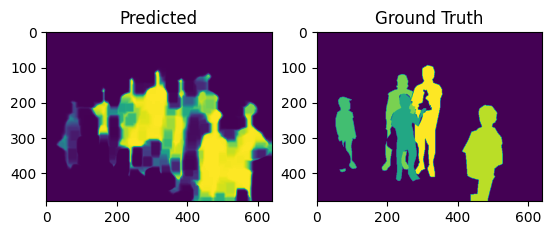

Processing Images:   2%|▏         | 10/500 [00:04<03:24,  2.40it/s]

[1]
[3]
SPRC: nan


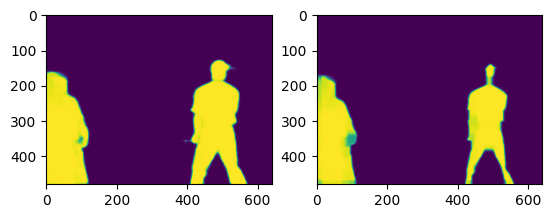

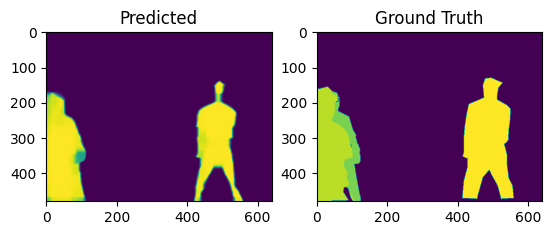

Processing Images:   2%|▏         | 11/500 [00:04<03:29,  2.34it/s]

[2, 1]
[3, 1]
SPRC: 1.0


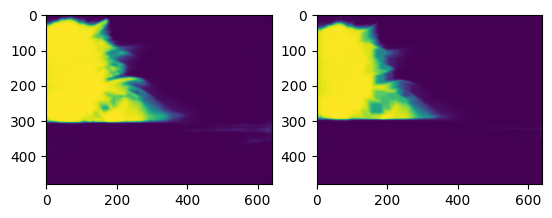

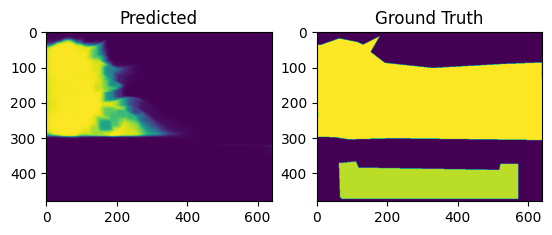

Processing Images:   2%|▏         | 12/500 [00:05<03:26,  2.37it/s]

[1]
[2]
SPRC: nan


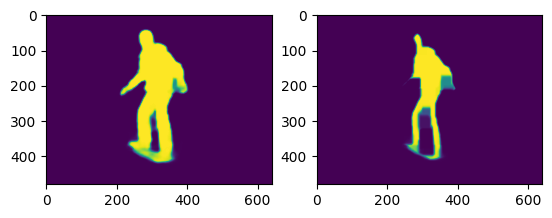

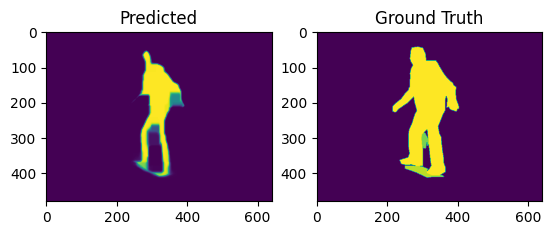

Processing Images:   3%|▎         | 13/500 [00:05<03:21,  2.42it/s]

[1]
[3]
SPRC: nan


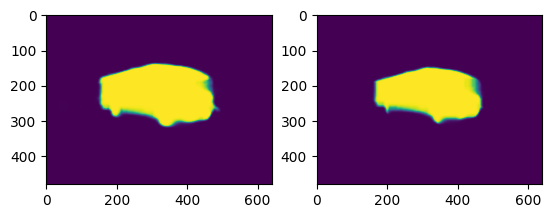

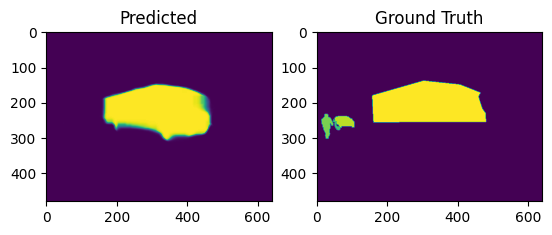

Processing Images:   3%|▎         | 14/500 [00:05<03:16,  2.47it/s]

[1, 2]
[4, 1]
SPRC: 5.551115123125783e-17


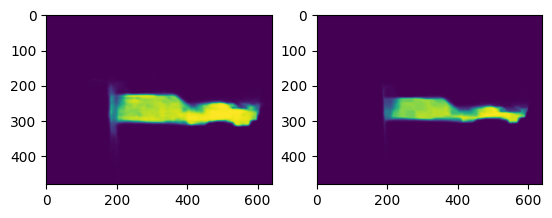

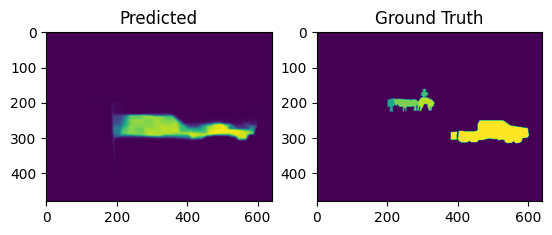

Processing Images:   3%|▎         | 15/500 [00:06<03:13,  2.50it/s]

[1]
[4]
SPRC: nan


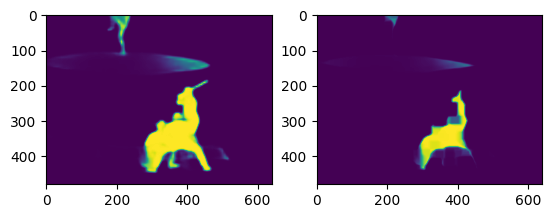

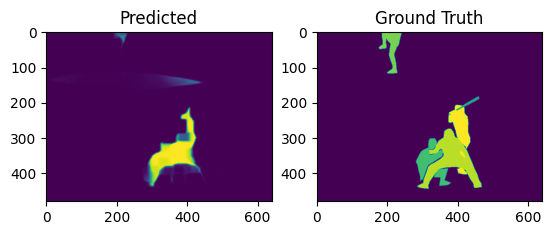

Processing Images:   3%|▎         | 16/500 [00:06<03:13,  2.51it/s]

[2, 1]
[1, 4]
SPRC: 5.551115123125783e-17


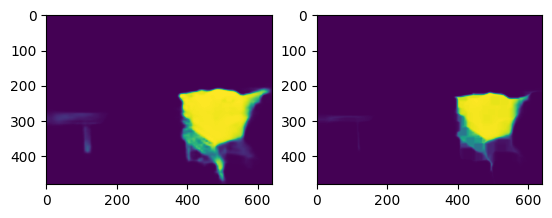

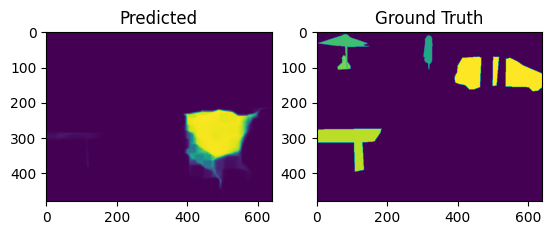

Processing Images:   3%|▎         | 17/500 [00:07<03:12,  2.51it/s]

[1]
[5]
SPRC: nan


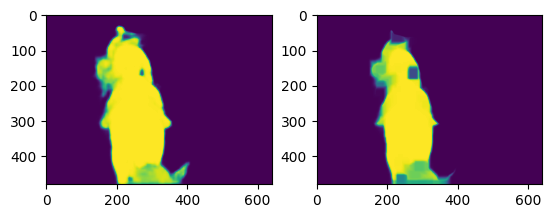

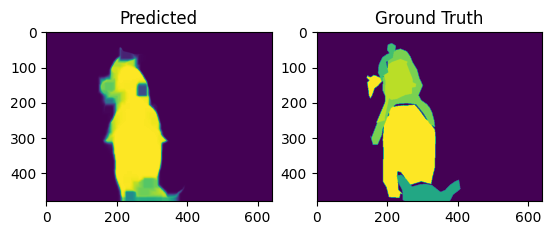

Processing Images:   4%|▎         | 18/500 [00:07<03:11,  2.52it/s]

[1]
[1]
SPRC: nan


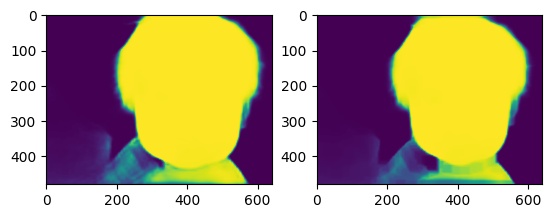

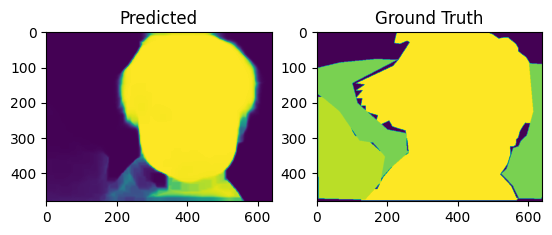

Processing Images:   4%|▍         | 19/500 [00:07<03:10,  2.53it/s]

[1]
[3]
SPRC: nan


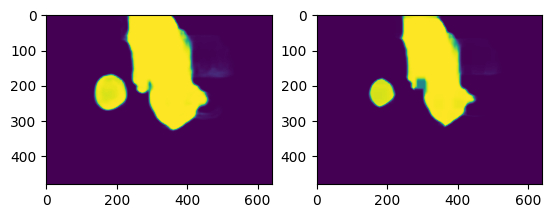

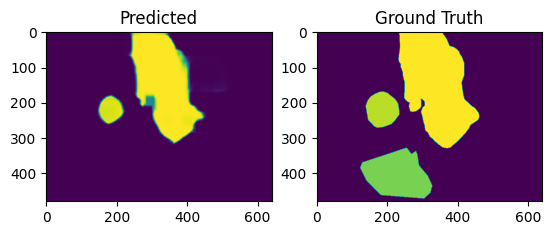

Processing Images:   4%|▍         | 20/500 [00:08<03:10,  2.52it/s]

[1, 2]
[2, 3]
SPRC: 1.0


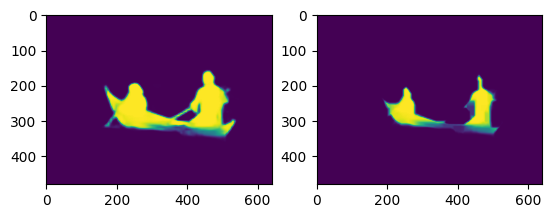

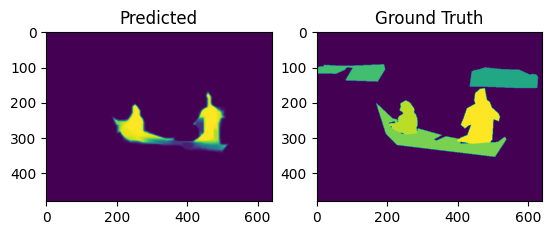

Processing Images:   4%|▍         | 21/500 [00:08<03:10,  2.52it/s]

[1]
[5]
SPRC: nan


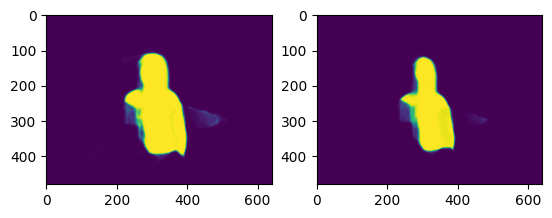

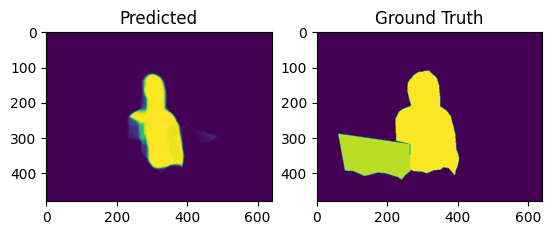

Processing Images:   4%|▍         | 22/500 [00:09<03:08,  2.54it/s]

[1]
[2]
SPRC: nan


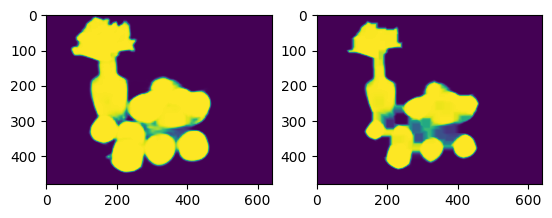

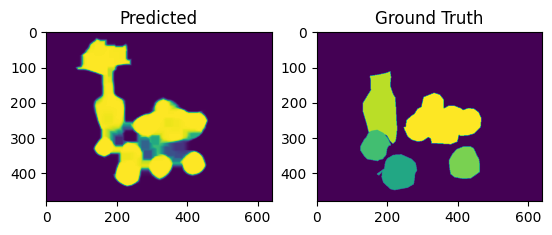

Processing Images:   5%|▍         | 23/500 [00:09<03:09,  2.52it/s]

[1]
[3]
SPRC: nan


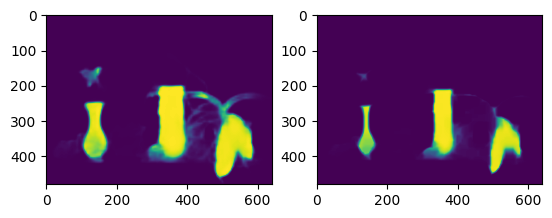

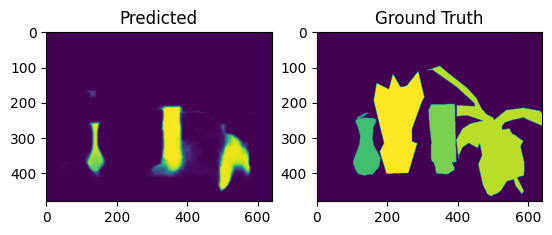

Processing Images:   5%|▍         | 24/500 [00:10<03:36,  2.20it/s]

[1, 2]
[3, 1]
SPRC: 5.551115123125783e-17


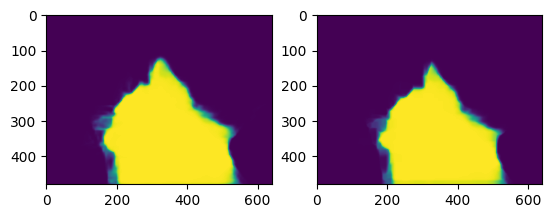

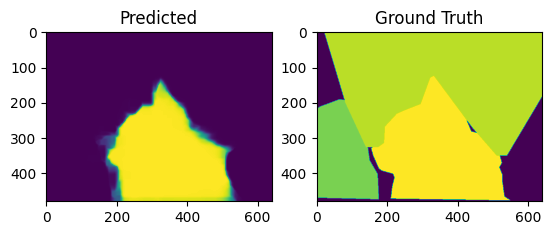

Processing Images:   5%|▌         | 25/500 [00:10<03:31,  2.25it/s]

[1]
[3]
SPRC: nan


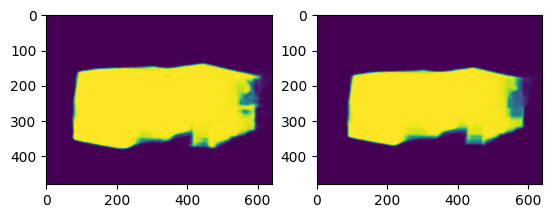

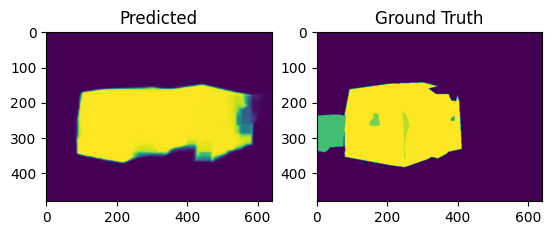

Processing Images:   5%|▌         | 26/500 [00:11<04:29,  1.76it/s]

[1]
[5]
SPRC: nan


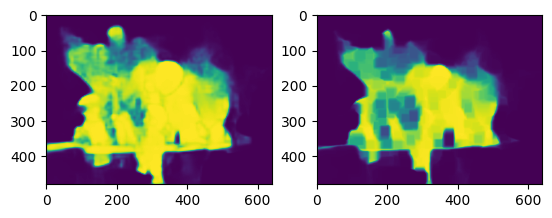

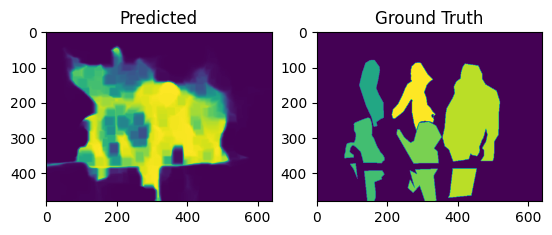

Processing Images:   5%|▌         | 27/500 [00:11<04:09,  1.90it/s]

[1]
[1]
SPRC: nan


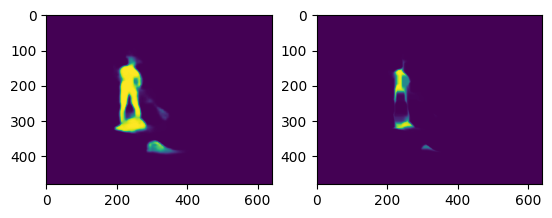

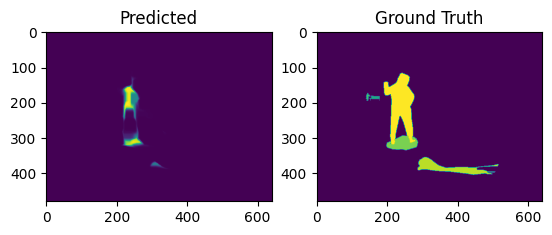

Processing Images:   6%|▌         | 28/500 [00:12<04:01,  1.96it/s]

[1, 2]
[3, 5]
SPRC: 1.0


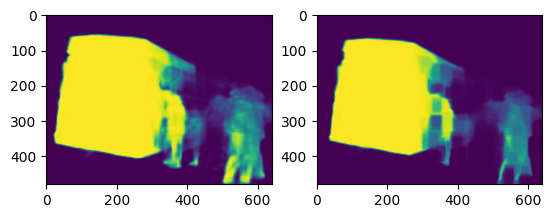

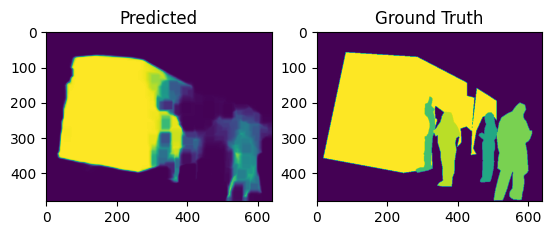

Processing Images:   6%|▌         | 29/500 [00:12<03:45,  2.08it/s]

[1]
[2]
SPRC: nan


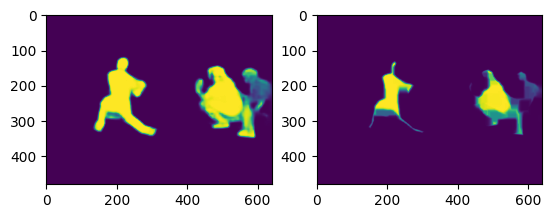

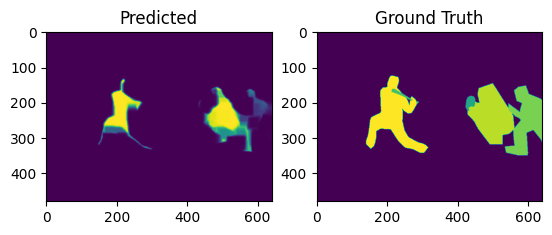

Processing Images:   6%|▌         | 30/500 [00:13<03:38,  2.15it/s]

[2, 1]
[4, 3]
SPRC: 1.0


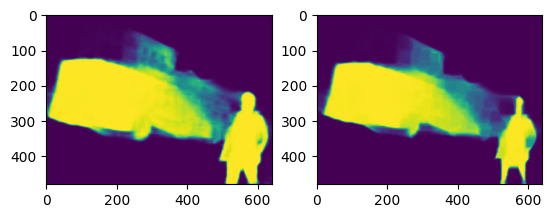

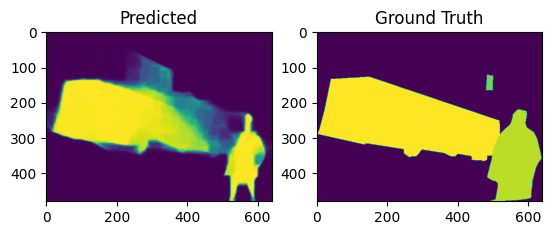

Processing Images:   6%|▌         | 31/500 [00:13<03:41,  2.12it/s]

[1]
[2]
SPRC: nan


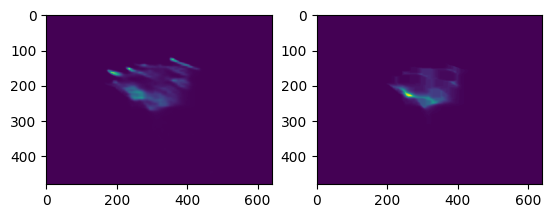

Processing Images:   6%|▋         | 32/500 [00:13<03:03,  2.56it/s]

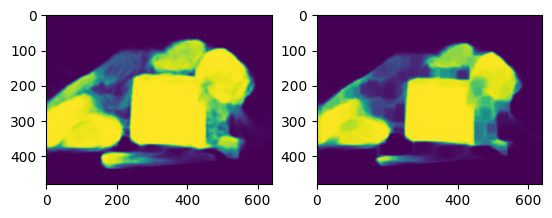

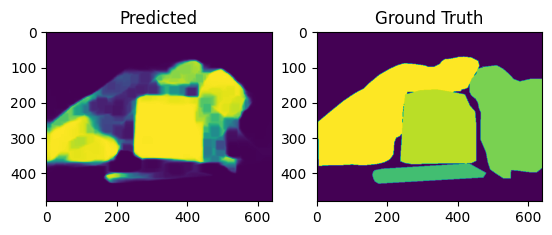

Processing Images:   7%|▋         | 33/500 [00:14<03:07,  2.50it/s]

[1]
[3]
SPRC: nan


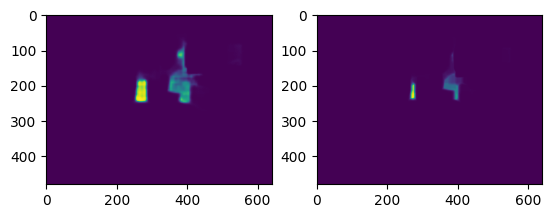

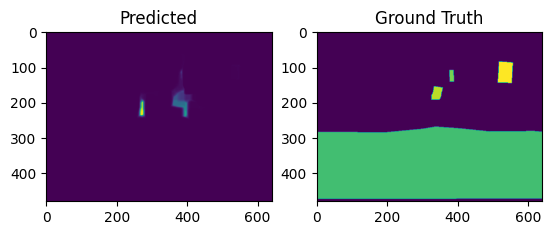

Processing Images:   7%|▋         | 34/500 [00:14<03:17,  2.36it/s]

[1]
[3]
SPRC: nan


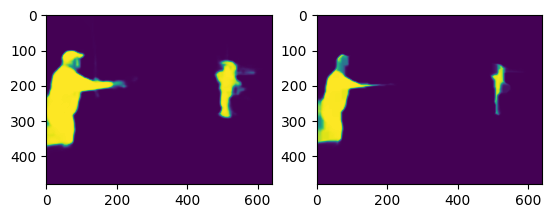

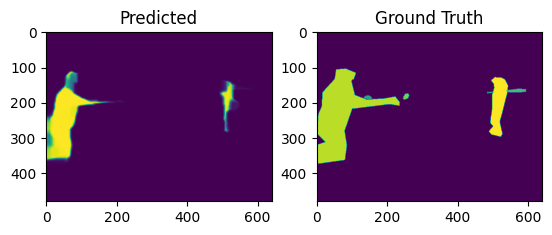

Processing Images:   7%|▋         | 35/500 [00:15<03:15,  2.38it/s]

[1, 2]
[3, 5]
SPRC: 1.0


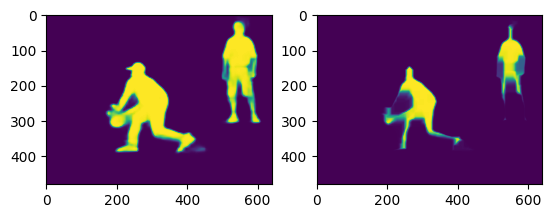

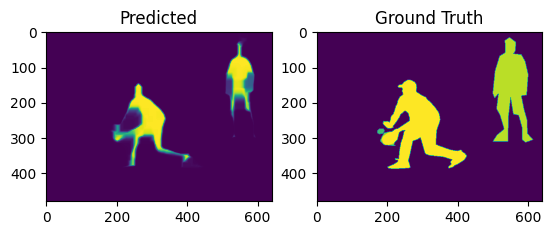

Processing Images:   7%|▋         | 36/500 [00:15<03:31,  2.20it/s]

[2, 1]
[4, 3]
SPRC: 1.0


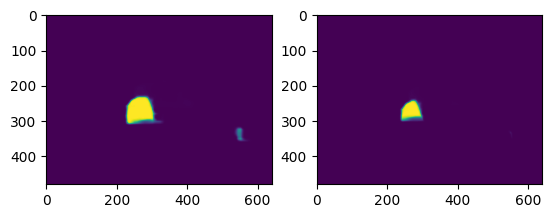

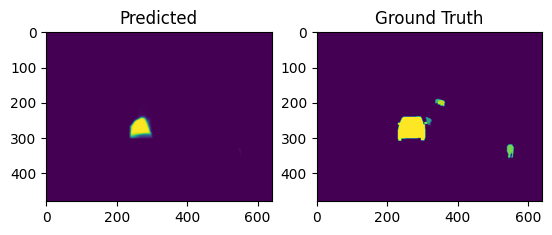

Processing Images:   7%|▋         | 37/500 [00:16<03:23,  2.27it/s]

[1, 2]
[4, 2]
SPRC: 5.551115123125783e-17


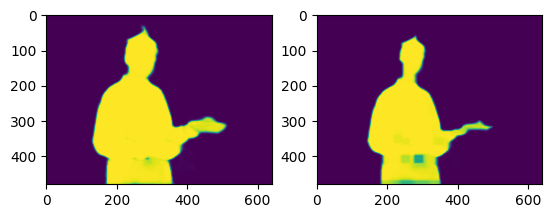

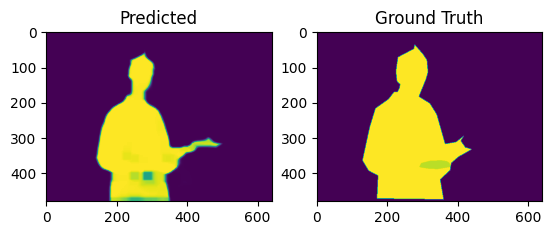

Processing Images:   8%|▊         | 38/500 [00:16<03:32,  2.17it/s]

[1]
[2]
SPRC: nan


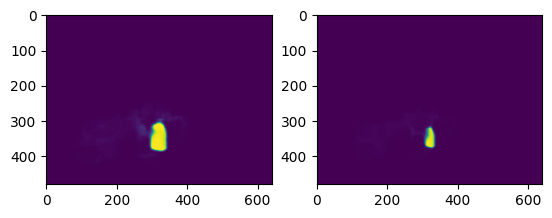

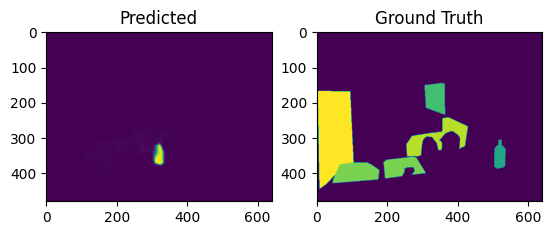

Processing Images:   8%|▊         | 39/500 [00:16<03:21,  2.28it/s]

[1]
[2]
SPRC: nan


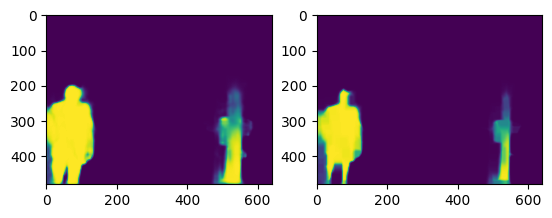

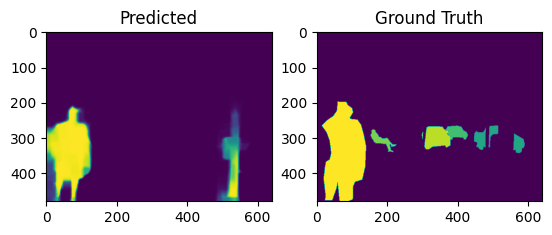

Processing Images:   8%|▊         | 40/500 [00:17<03:48,  2.01it/s]

[1]
[3]
SPRC: nan


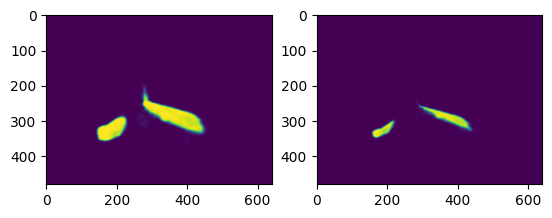

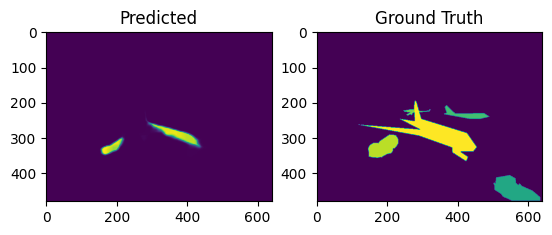

Processing Images:   8%|▊         | 41/500 [00:17<03:34,  2.14it/s]

[1, 2]
[3, 4]
SPRC: 1.0


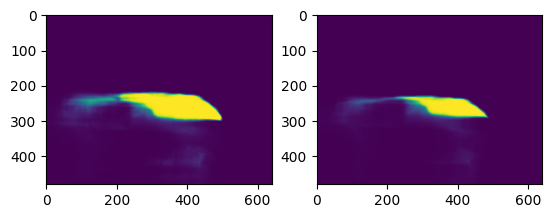

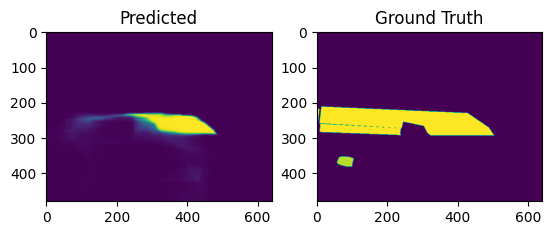

Processing Images:   8%|▊         | 42/500 [00:18<03:43,  2.05it/s]

[1]
[2]
SPRC: nan


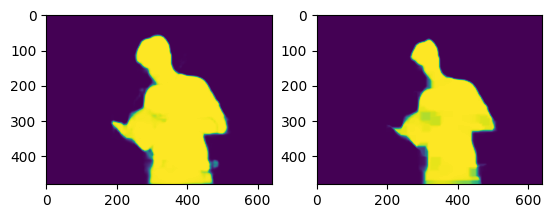

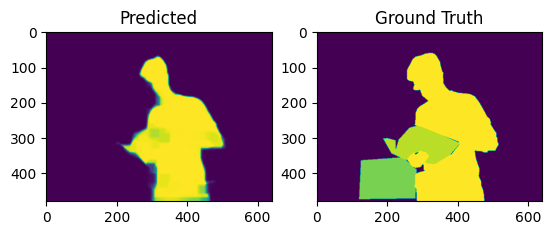

Processing Images:   9%|▊         | 43/500 [00:18<03:48,  2.00it/s]

[1]
[3]
SPRC: nan


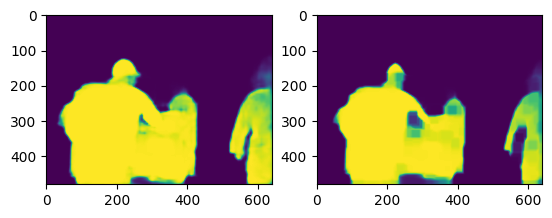

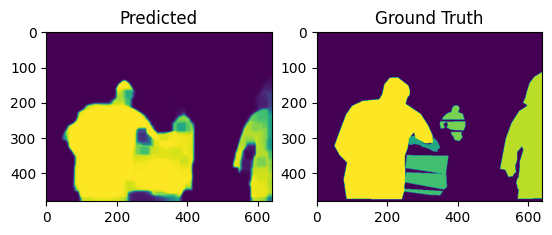

Processing Images:   9%|▉         | 44/500 [00:19<03:58,  1.91it/s]

[2, 1]
[3, 2]
SPRC: 1.0


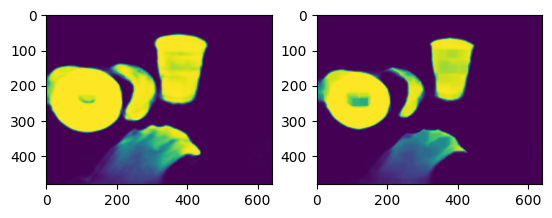

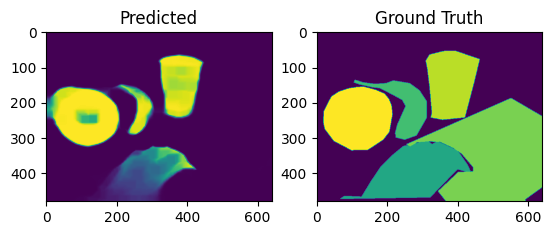

Processing Images:   9%|▉         | 45/500 [00:20<03:51,  1.96it/s]

[1, 2]
[5, 3]
SPRC: 5.551115123125783e-17


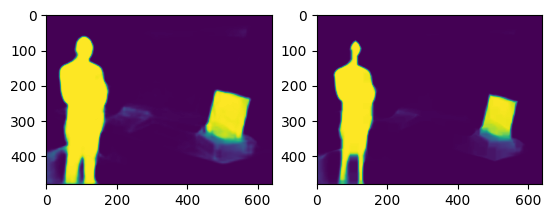

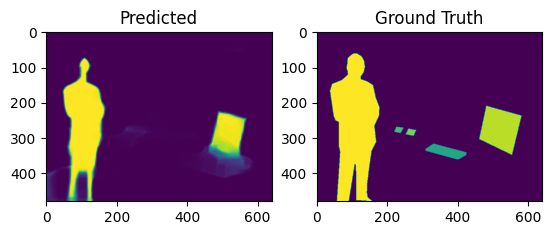

Processing Images:   9%|▉         | 46/500 [00:20<03:39,  2.07it/s]

[1, 2]
[4, 3]
SPRC: 5.551115123125783e-17


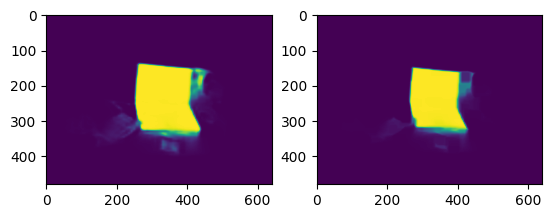

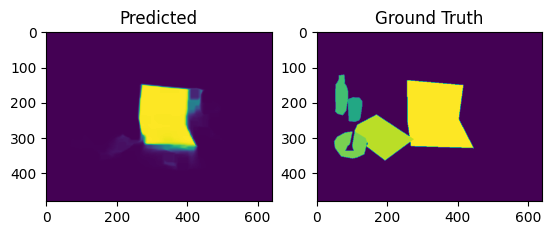

Processing Images:   9%|▉         | 47/500 [00:20<03:41,  2.05it/s]

[1]
[5]
SPRC: nan


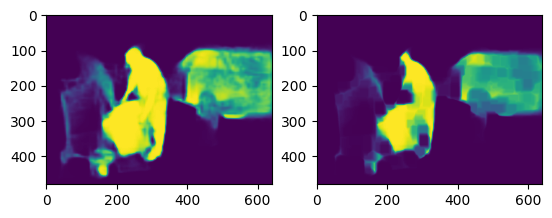

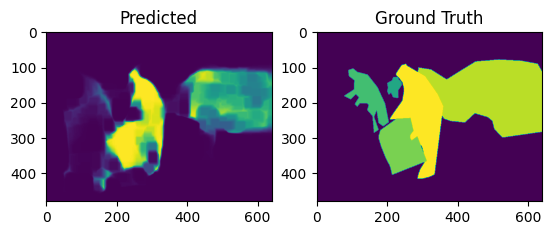

Processing Images:  10%|▉         | 48/500 [00:21<03:42,  2.03it/s]

[1]
[3]
SPRC: nan


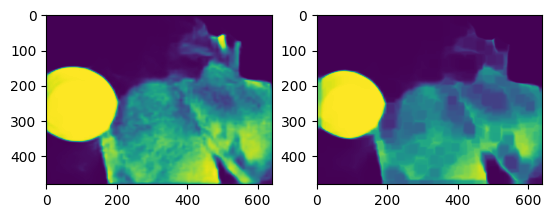

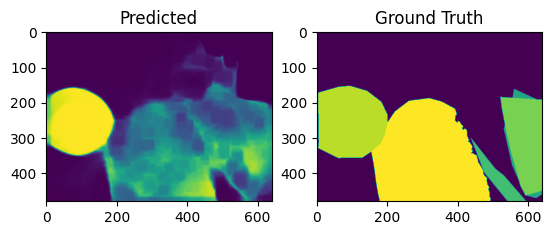

Processing Images:  10%|▉         | 49/500 [00:21<03:33,  2.11it/s]

[1]
[3]
SPRC: nan


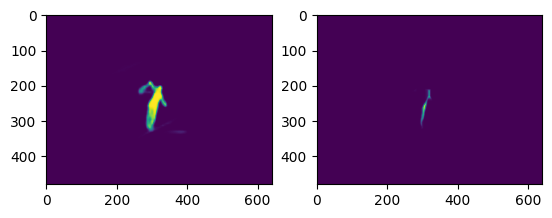

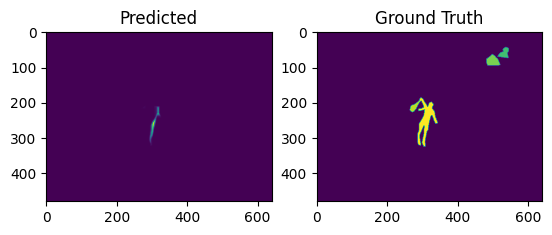

Processing Images:  10%|█         | 50/500 [00:22<03:25,  2.19it/s]

[2, 1]
[4, 2]
SPRC: 1.0


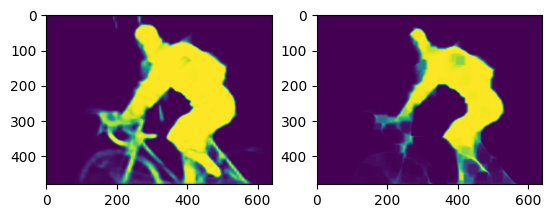

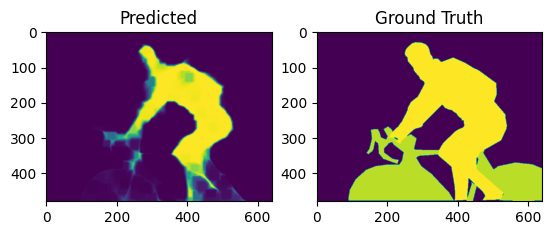

Processing Images:  10%|█         | 51/500 [00:22<03:34,  2.09it/s]

[1]
[1]
SPRC: nan


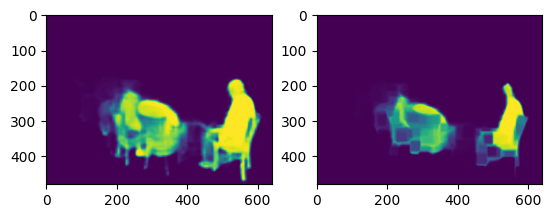

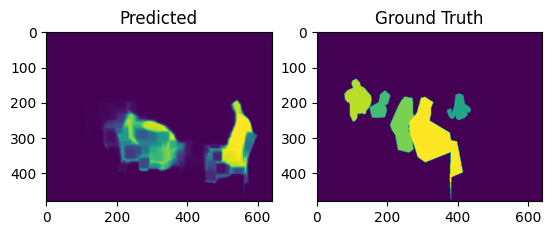

Processing Images:  10%|█         | 52/500 [00:23<04:27,  1.67it/s]

[1]
[4]
SPRC: nan


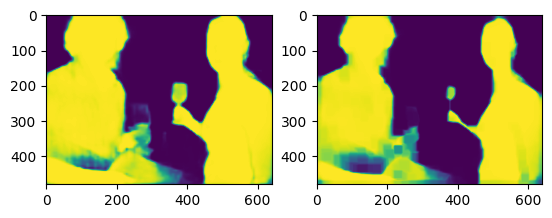

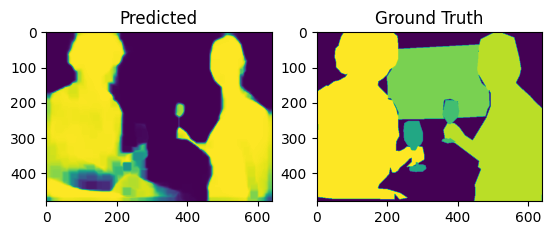

Processing Images:  11%|█         | 53/500 [00:24<04:01,  1.85it/s]

[1]
[5]
SPRC: nan


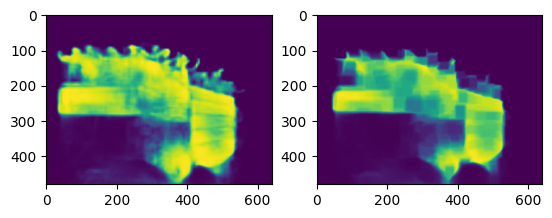

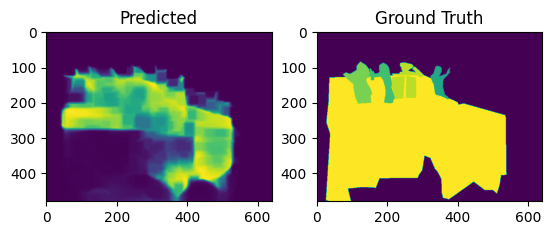

Processing Images:  11%|█         | 54/500 [00:24<03:58,  1.87it/s]

[1]
[5]
SPRC: nan


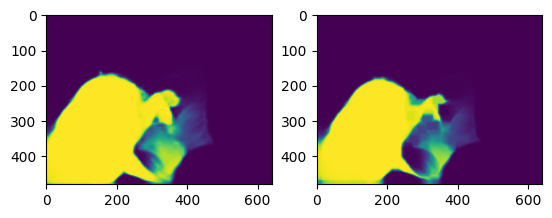

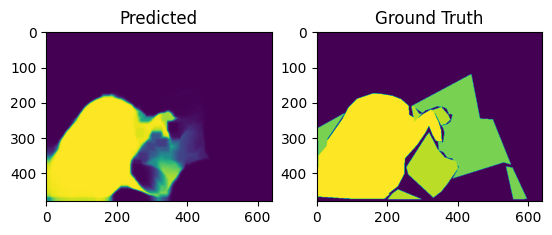

Processing Images:  11%|█         | 55/500 [00:25<03:39,  2.02it/s]

[1]
[1]
SPRC: nan


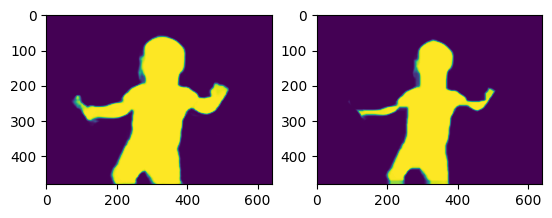

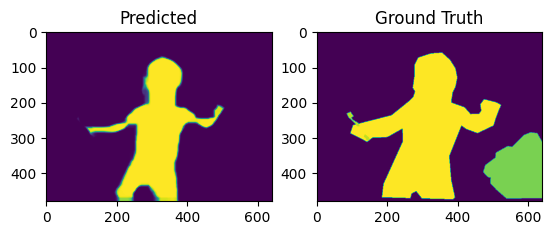

Processing Images:  11%|█         | 56/500 [00:25<03:58,  1.87it/s]

[1]
[2]
SPRC: nan


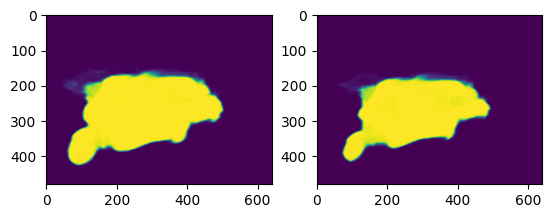

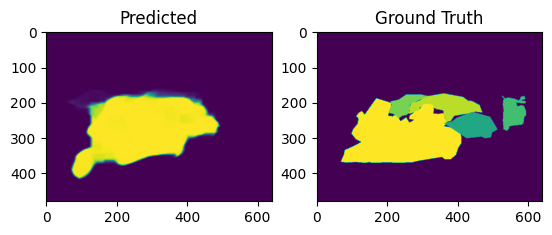

Processing Images:  11%|█▏        | 57/500 [00:26<03:43,  1.98it/s]

[1]
[4]
SPRC: nan


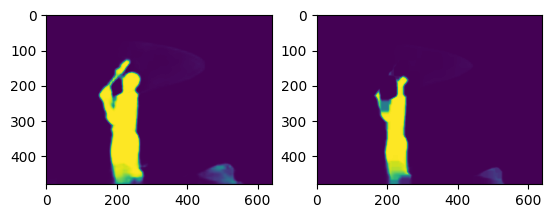

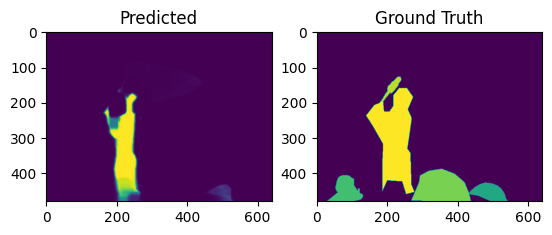

Processing Images:  12%|█▏        | 58/500 [00:26<03:49,  1.93it/s]

[1, 2]
[2, 1]
SPRC: 5.551115123125783e-17


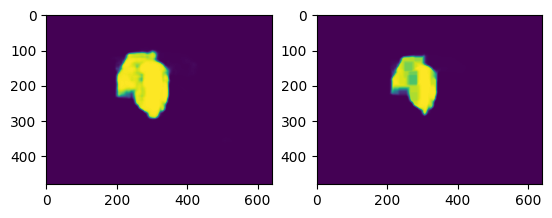

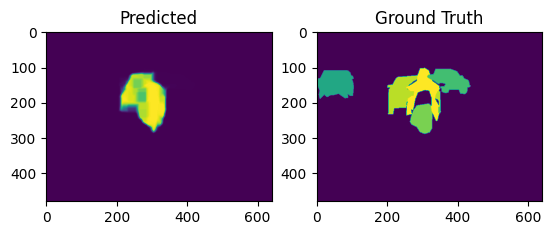

Processing Images:  12%|█▏        | 59/500 [00:27<03:33,  2.07it/s]

[1]
[2]
SPRC: nan


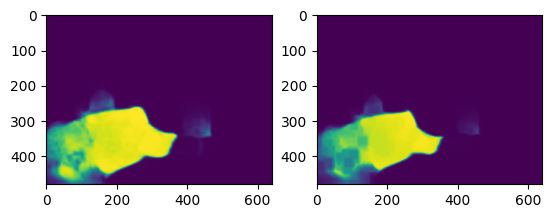

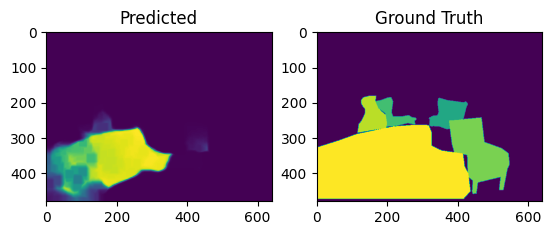

Processing Images:  12%|█▏        | 60/500 [00:27<03:43,  1.97it/s]

[1]
[4]
SPRC: nan


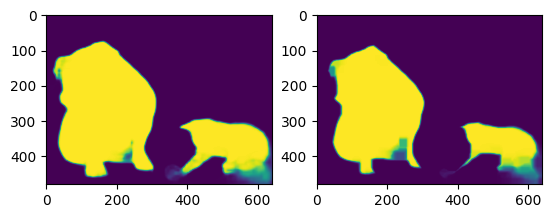

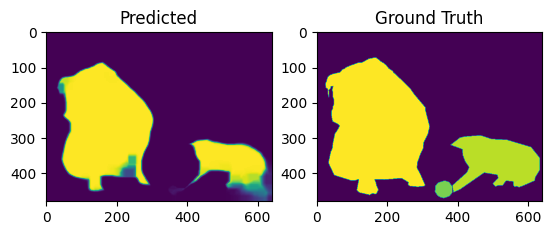

Processing Images:  12%|█▏        | 61/500 [00:28<03:38,  2.01it/s]

[1, 2]
[3, 2]
SPRC: 5.551115123125783e-17


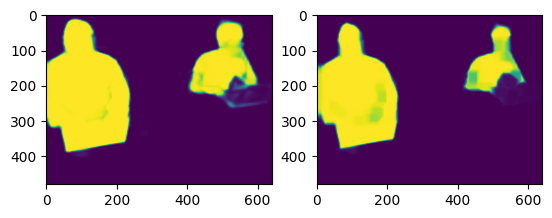

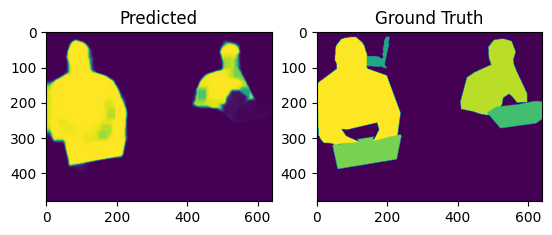

Processing Images:  12%|█▏        | 62/500 [00:28<03:43,  1.96it/s]

[2, 1]
[2, 3]
SPRC: 5.551115123125783e-17


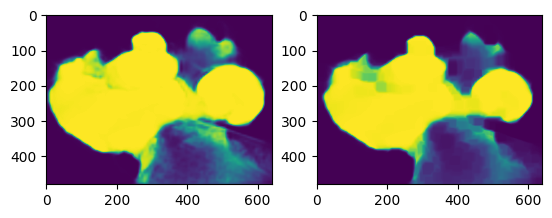

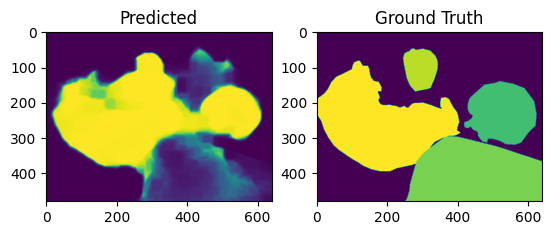

Processing Images:  13%|█▎        | 63/500 [00:29<03:30,  2.07it/s]

[1]
[1]
SPRC: nan


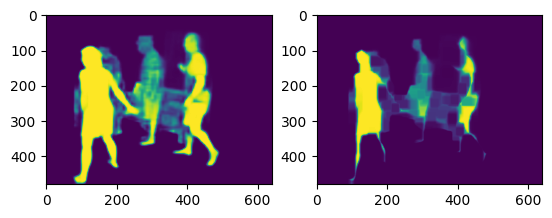

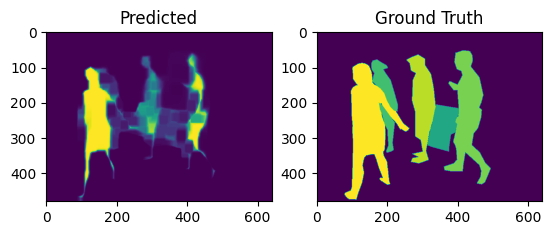

Processing Images:  13%|█▎        | 64/500 [00:29<03:47,  1.92it/s]

[1]
[2]
SPRC: nan


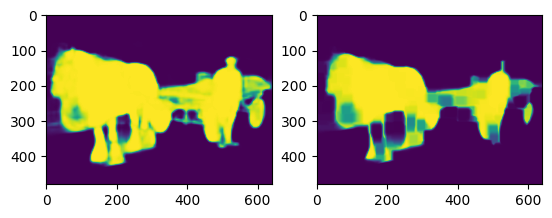

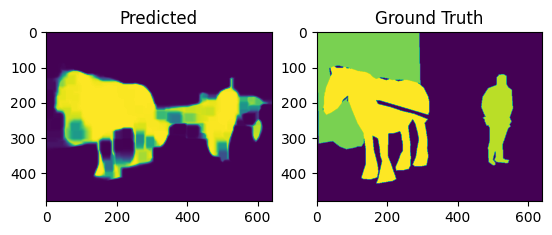

Processing Images:  13%|█▎        | 65/500 [00:30<03:43,  1.94it/s]

[1]
[3]
SPRC: nan


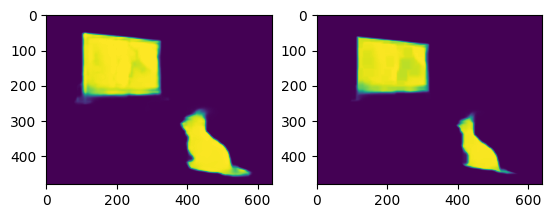

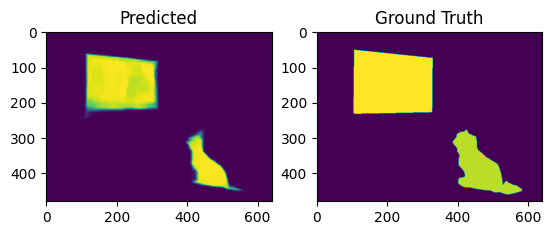

Processing Images:  13%|█▎        | 66/500 [00:30<03:38,  1.98it/s]

[1, 2]
[2, 1]
SPRC: 5.551115123125783e-17


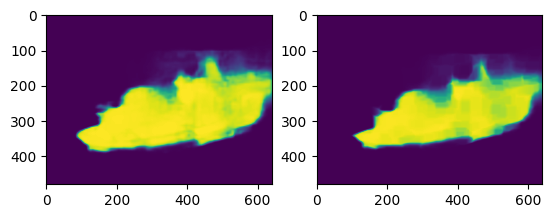

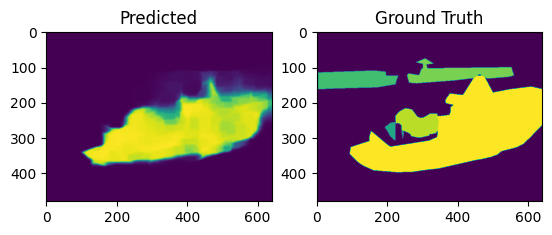

Processing Images:  13%|█▎        | 67/500 [00:31<03:39,  1.97it/s]

[1]
[5]
SPRC: nan


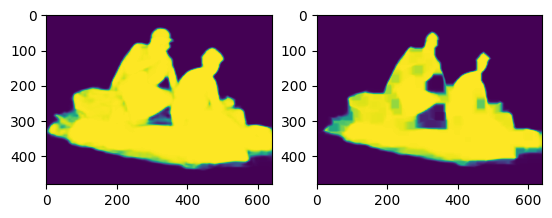

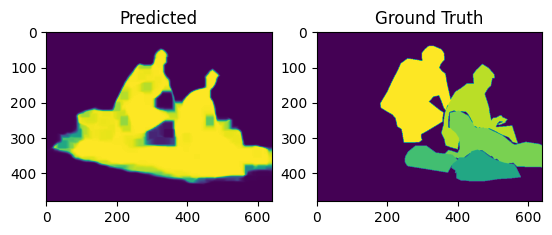

Processing Images:  14%|█▎        | 68/500 [00:31<03:26,  2.09it/s]

[1]
[2]
SPRC: nan


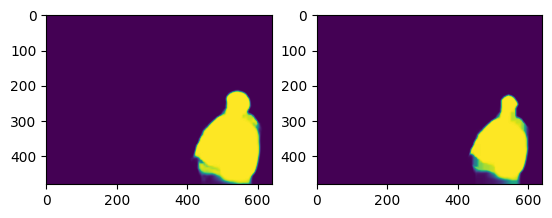

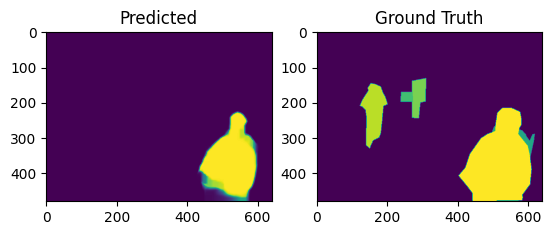

Processing Images:  14%|█▍        | 69/500 [00:32<03:32,  2.03it/s]

[1]
[4]
SPRC: nan


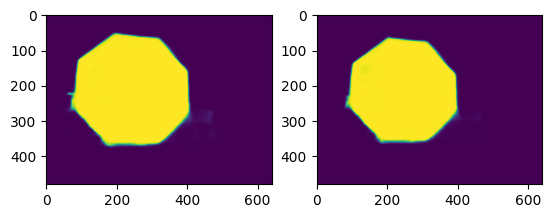

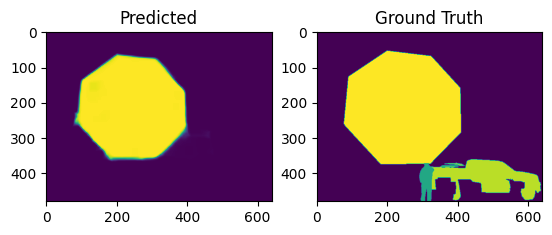

Processing Images:  14%|█▍        | 70/500 [00:32<03:40,  1.95it/s]

[1]
[3]
SPRC: nan


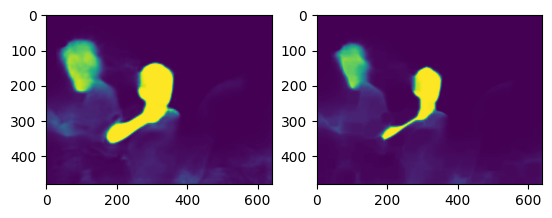

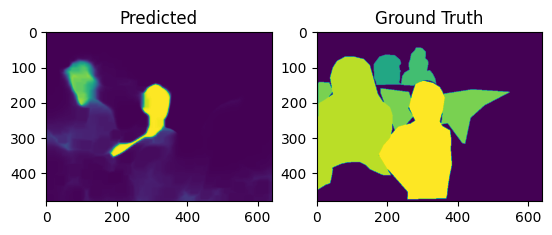

Processing Images:  14%|█▍        | 71/500 [00:33<03:40,  1.95it/s]

[1]
[4]
SPRC: nan


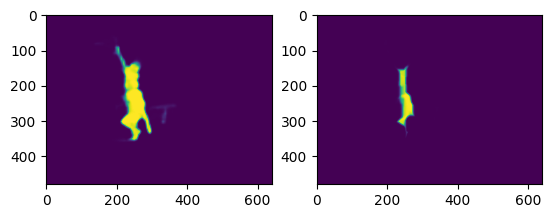

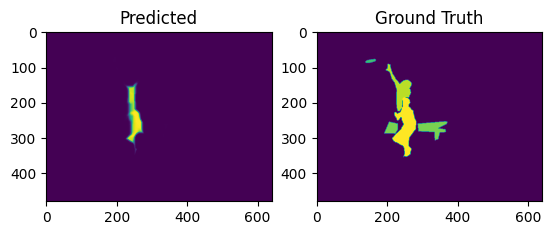

Processing Images:  14%|█▍        | 72/500 [00:33<03:28,  2.05it/s]

[1]
[2]
SPRC: nan


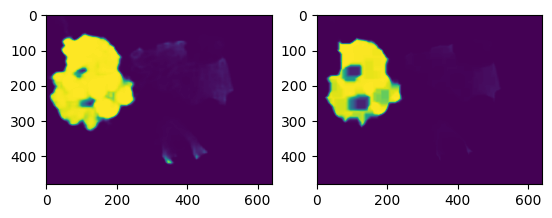

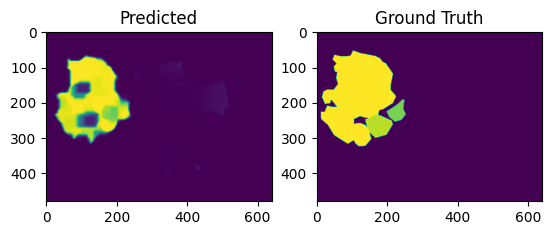

Processing Images:  15%|█▍        | 73/500 [00:34<03:35,  1.98it/s]

[1]
[3]
SPRC: nan


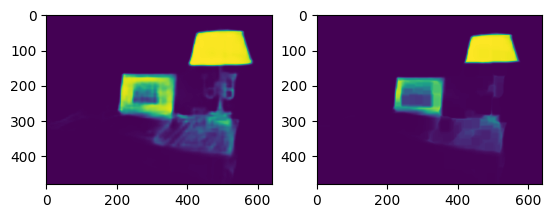

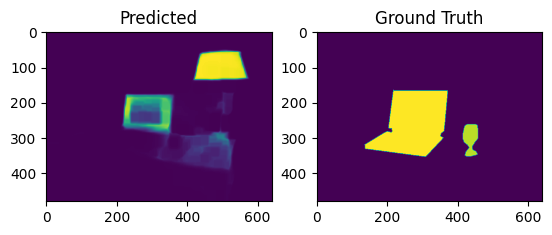

Processing Images:  15%|█▍        | 74/500 [00:34<03:53,  1.83it/s]

[1]
[2]
SPRC: nan


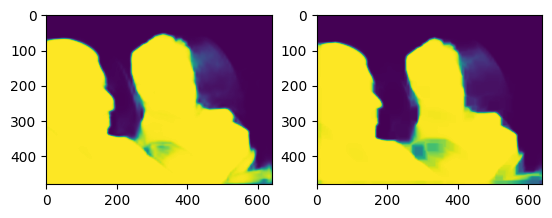

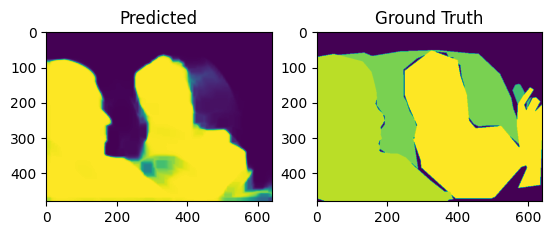

Processing Images:  15%|█▌        | 75/500 [00:35<03:45,  1.88it/s]

[1]
[2]
SPRC: nan


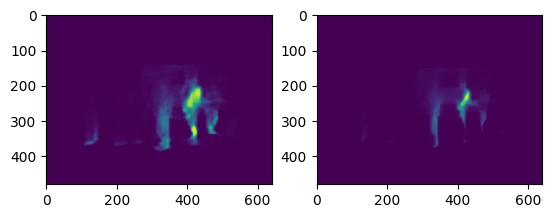

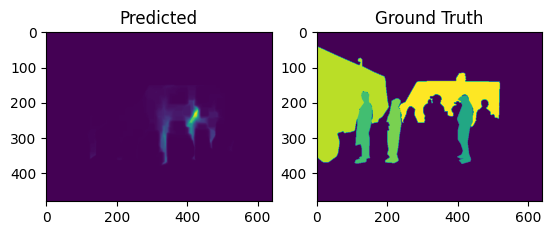

Processing Images:  15%|█▌        | 76/500 [00:35<03:43,  1.90it/s]

[1, 2]
[2, 1]
SPRC: 5.551115123125783e-17


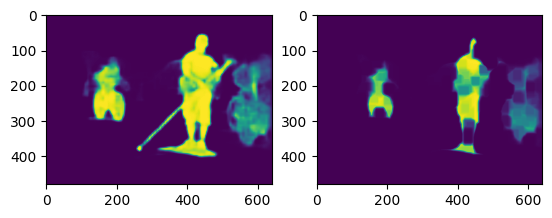

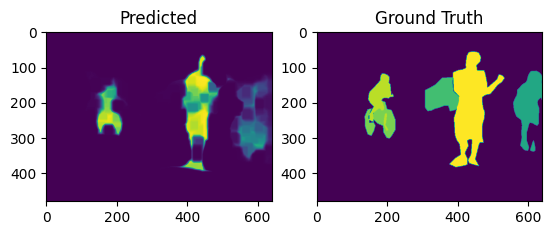

Processing Images:  15%|█▌        | 77/500 [00:36<03:46,  1.87it/s]

[1, 2]
[1, 4]
SPRC: 1.0


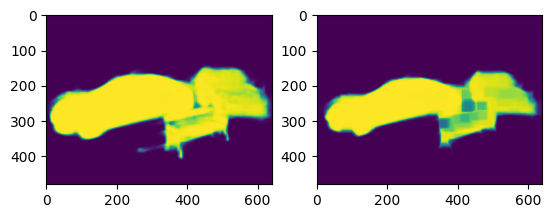

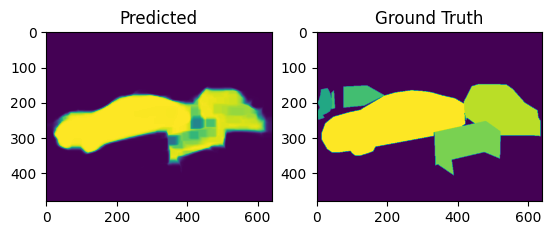

Processing Images:  16%|█▌        | 78/500 [00:37<04:41,  1.50it/s]

[1]
[3]
SPRC: nan


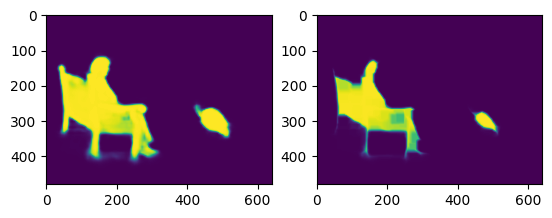

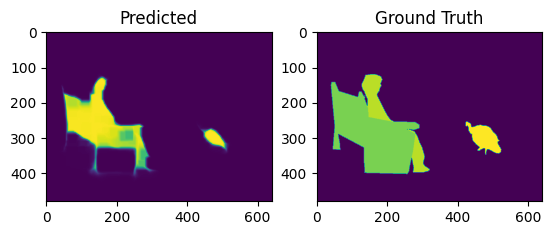

Processing Images:  16%|█▌        | 79/500 [00:37<04:36,  1.52it/s]

[1, 2]
[3, 1]
SPRC: 5.551115123125783e-17


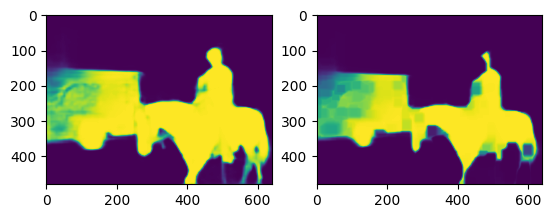

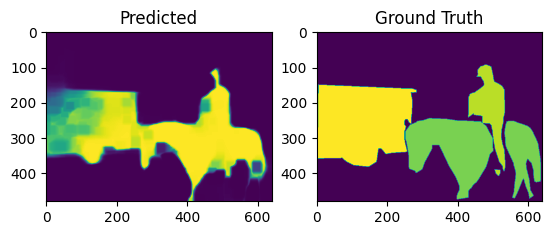

Processing Images:  16%|█▌        | 80/500 [00:38<04:12,  1.66it/s]

[1]
[1]
SPRC: nan


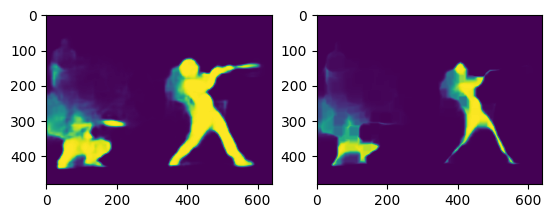

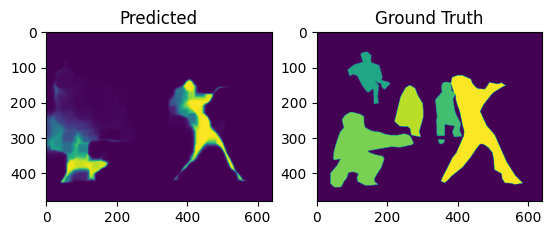

Processing Images:  16%|█▌        | 81/500 [00:39<04:12,  1.66it/s]

[1, 2]
[2, 3]
SPRC: 1.0


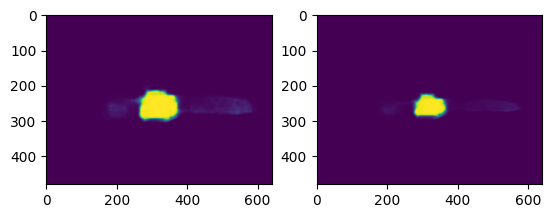

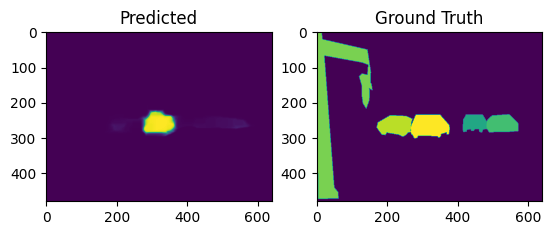

Processing Images:  16%|█▋        | 82/500 [00:39<04:10,  1.67it/s]

[1]
[3]
SPRC: nan


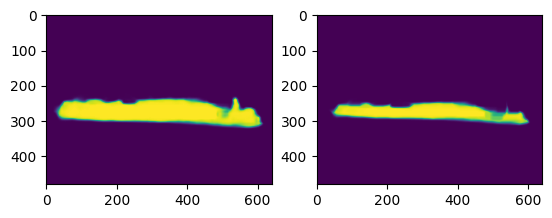

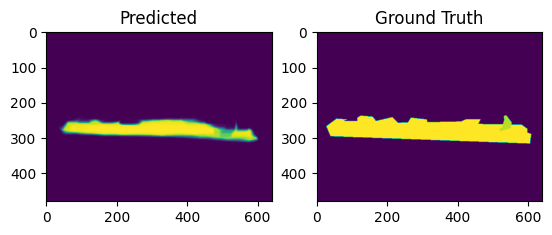

Processing Images:  17%|█▋        | 83/500 [00:40<03:43,  1.87it/s]

[1]
[2]
SPRC: nan


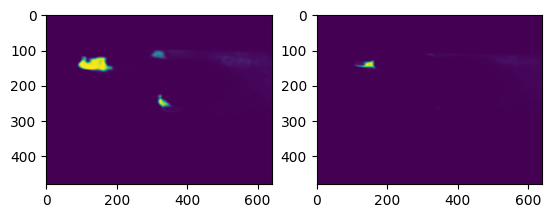

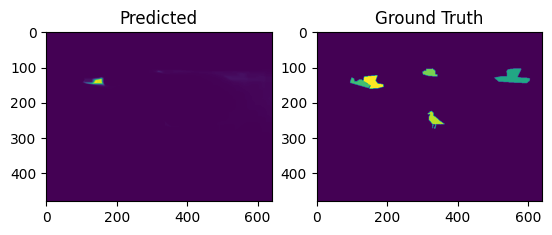

Processing Images:  17%|█▋        | 84/500 [00:40<03:35,  1.93it/s]

[1, 2]
[1, 4]
SPRC: 1.0


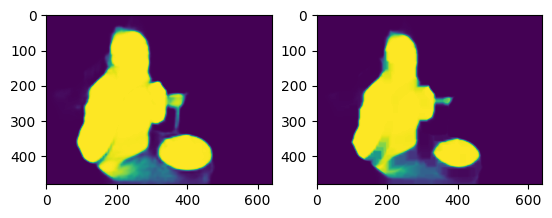

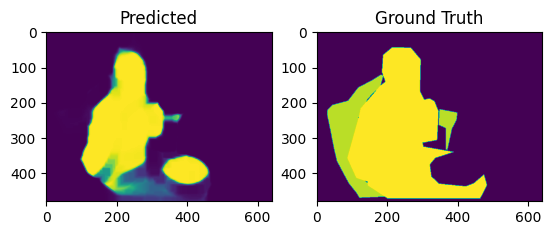

Processing Images:  17%|█▋        | 85/500 [00:41<03:38,  1.90it/s]

[1]
[2]
SPRC: nan


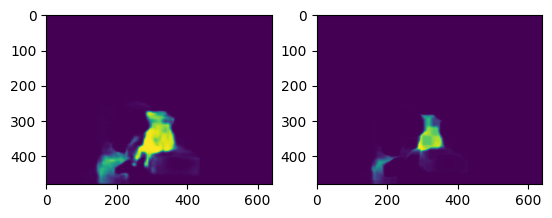

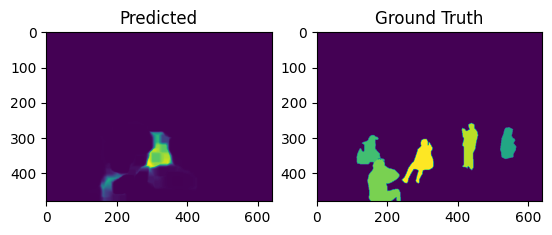

Processing Images:  17%|█▋        | 86/500 [00:41<03:43,  1.86it/s]

[1]
[2]
SPRC: nan


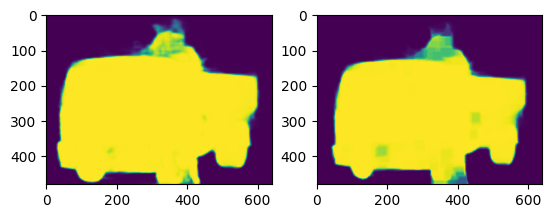

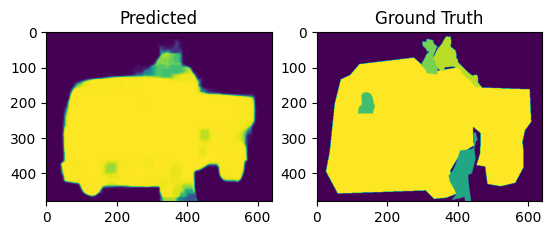

Processing Images:  17%|█▋        | 87/500 [00:42<03:42,  1.85it/s]

[1]
[4]
SPRC: nan


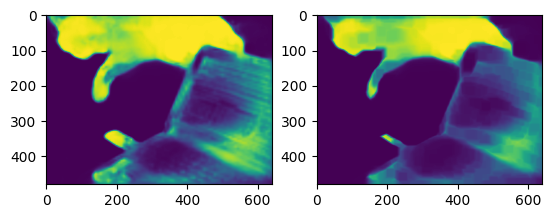

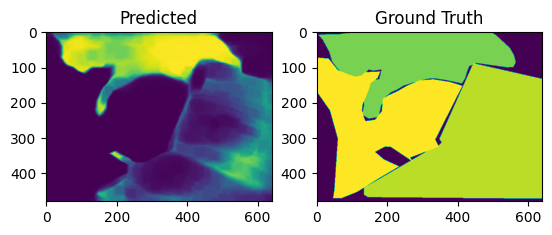

Processing Images:  18%|█▊        | 88/500 [00:42<03:44,  1.84it/s]

[1]
[2]
SPRC: nan


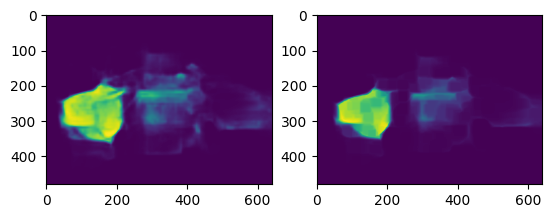

Processing Images:  18%|█▊        | 89/500 [00:42<03:05,  2.21it/s]

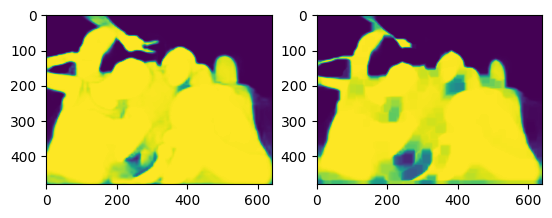

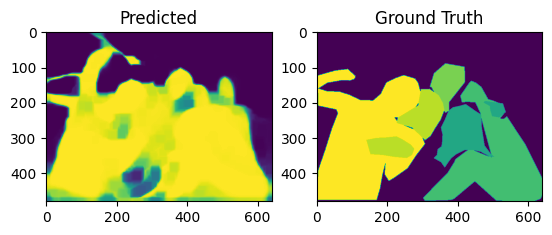

Processing Images:  18%|█▊        | 90/500 [00:43<03:30,  1.95it/s]

[1]
[4]
SPRC: nan


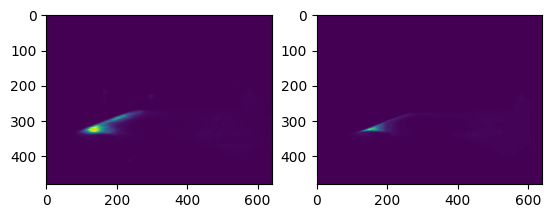

Processing Images:  18%|█▊        | 91/500 [00:43<02:55,  2.33it/s]

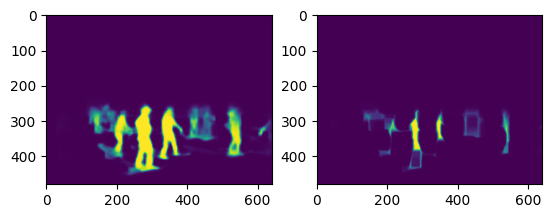

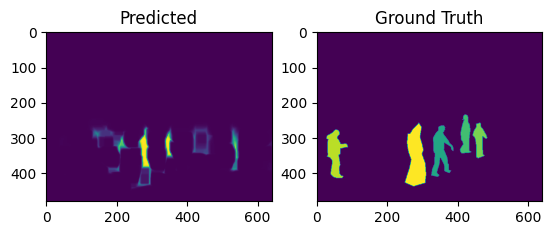

Processing Images:  18%|█▊        | 92/500 [00:44<03:21,  2.02it/s]

[1, 2]
[3, 4]
SPRC: 1.0


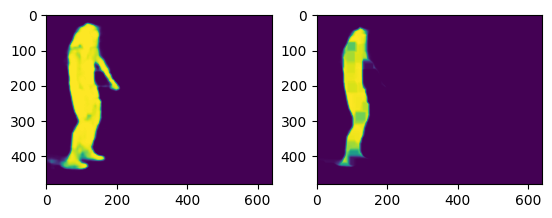

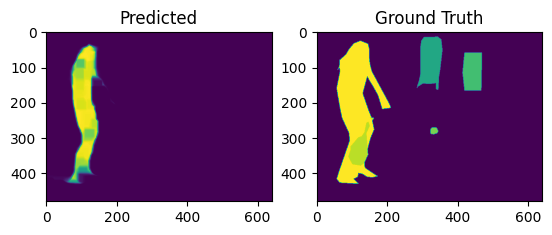

Processing Images:  19%|█▊        | 93/500 [00:45<03:32,  1.91it/s]

[1]
[2]
SPRC: nan


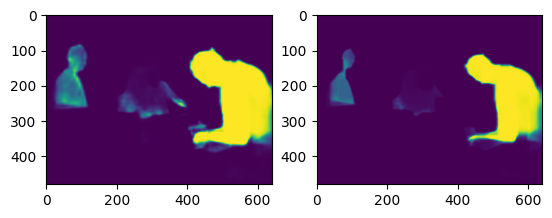

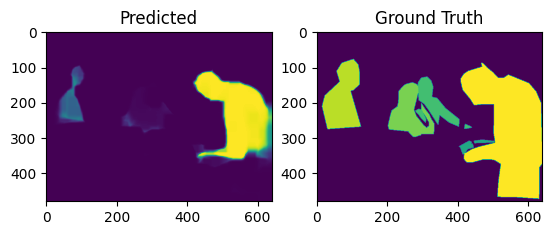

Processing Images:  19%|█▉        | 94/500 [00:45<03:37,  1.87it/s]

[3, 1, 2]
[4, 5, 2]
SPRC: 0.25


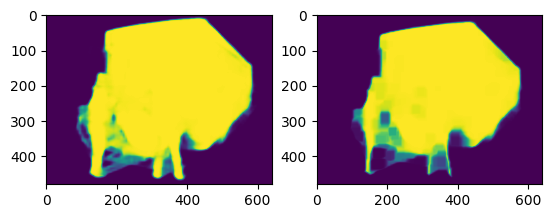

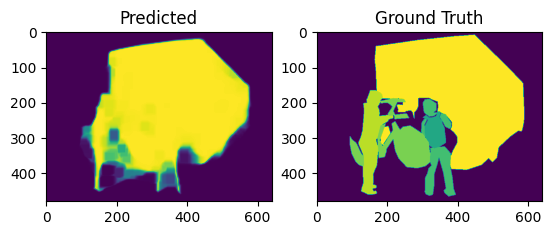

Processing Images:  19%|█▉        | 95/500 [00:46<03:34,  1.89it/s]

[1]
[5]
SPRC: nan


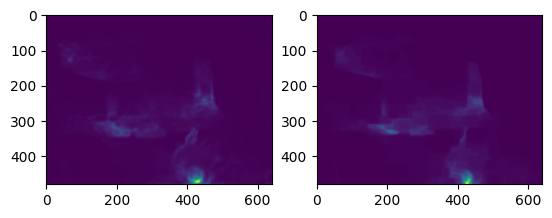

Processing Images:  19%|█▉        | 96/500 [00:46<03:23,  1.98it/s]

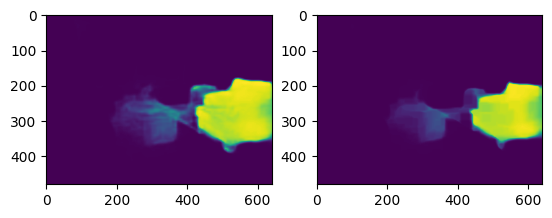

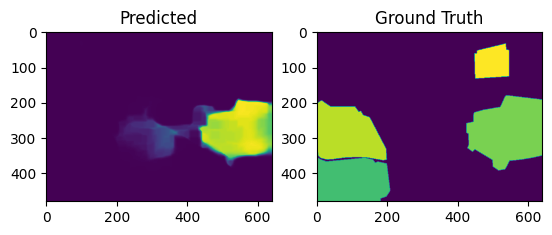

Processing Images:  19%|█▉        | 97/500 [00:47<03:30,  1.92it/s]

[1]
[2]
SPRC: nan


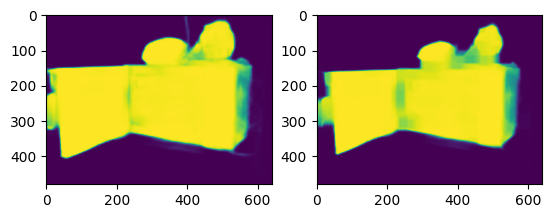

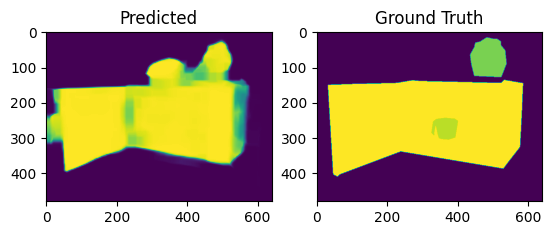

Processing Images:  20%|█▉        | 98/500 [00:47<03:33,  1.88it/s]

[1]
[2]
SPRC: nan


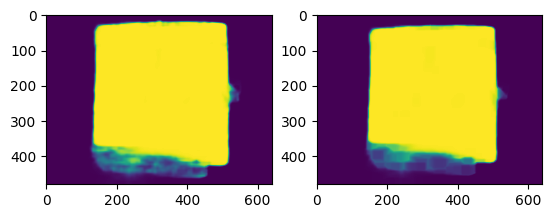

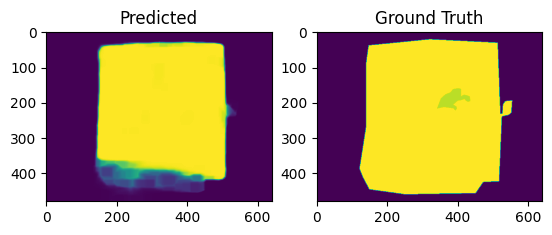

Processing Images:  20%|█▉        | 99/500 [00:48<03:44,  1.79it/s]

[1]
[2]
SPRC: nan


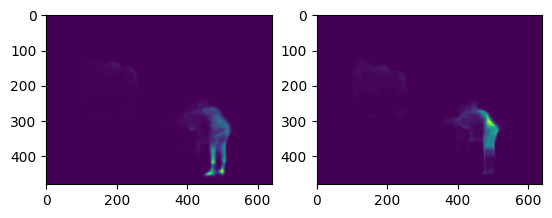

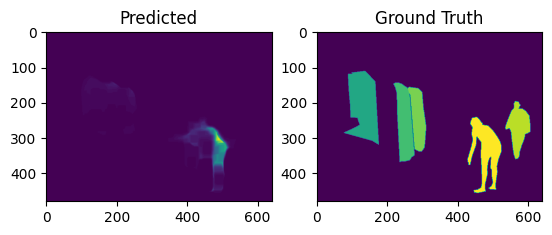

Processing Images:  20%|██        | 100/500 [00:48<03:41,  1.80it/s]

[2, 1]
[5, 3]
SPRC: 1.0


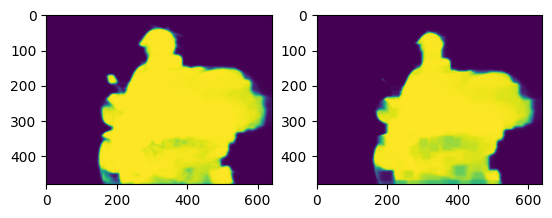

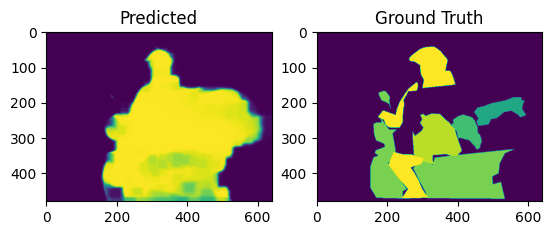

Processing Images:  20%|██        | 101/500 [00:49<03:41,  1.80it/s]

[1]
[2]
SPRC: nan


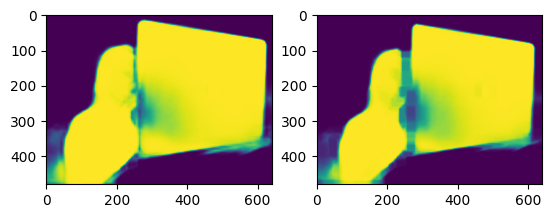

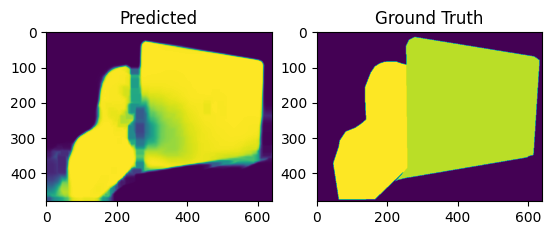

Processing Images:  20%|██        | 102/500 [00:49<03:21,  1.97it/s]

[1]
[2]
SPRC: nan


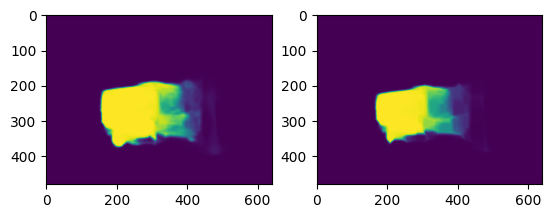

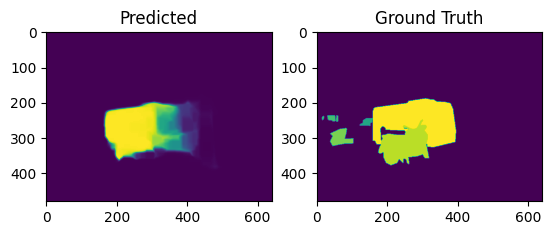

Processing Images:  21%|██        | 103/500 [00:50<03:08,  2.11it/s]

[1]
[5]
SPRC: nan


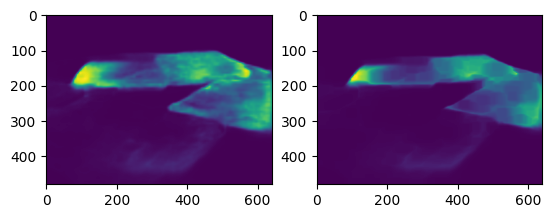

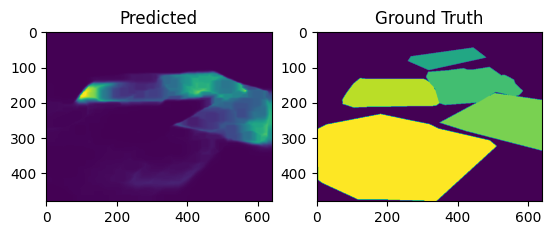

Processing Images:  21%|██        | 104/500 [00:50<03:27,  1.91it/s]

[1]
[3]
SPRC: nan


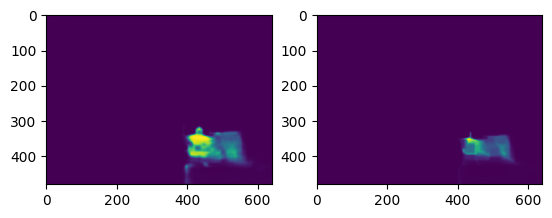

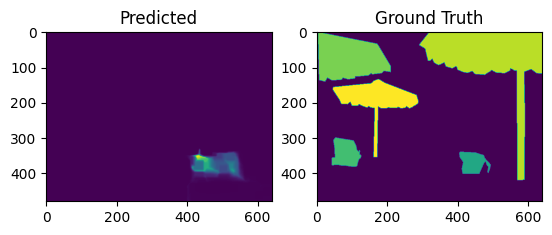

Processing Images:  21%|██        | 105/500 [00:51<04:28,  1.47it/s]

[1]
[2]
SPRC: nan


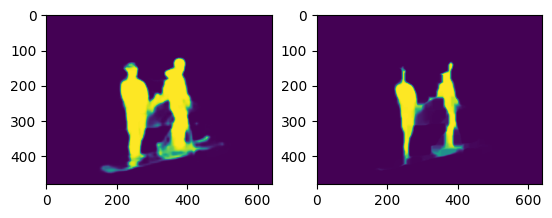

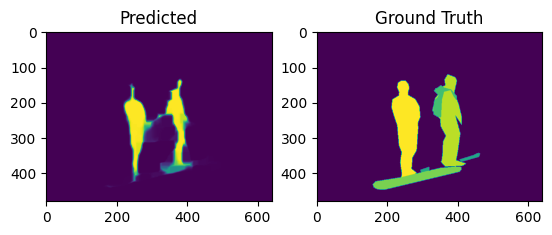

Processing Images:  21%|██        | 106/500 [00:52<03:56,  1.66it/s]

[1]
[3]
SPRC: nan


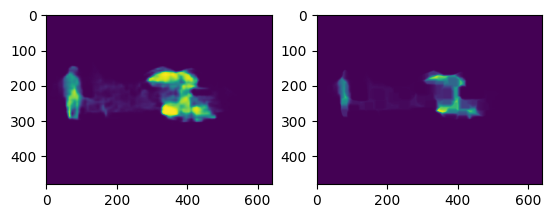

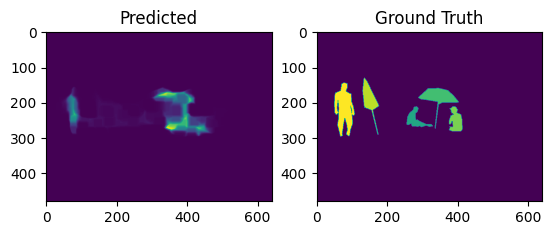

Processing Images:  21%|██▏       | 107/500 [00:53<04:17,  1.53it/s]

[1]
[5]
SPRC: nan


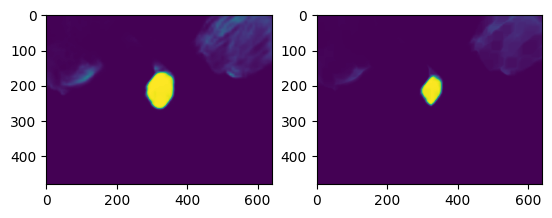

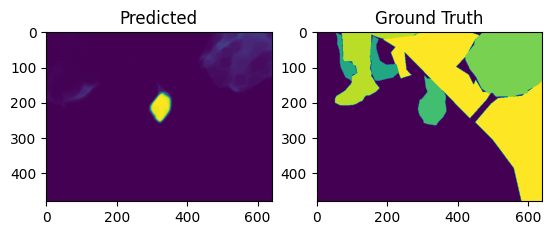

Processing Images:  22%|██▏       | 108/500 [00:53<04:02,  1.62it/s]

[2, 1, 3]
[4, 2, 3]
SPRC: 0.75


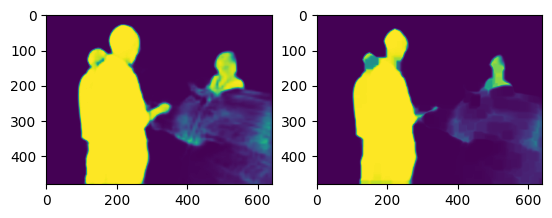

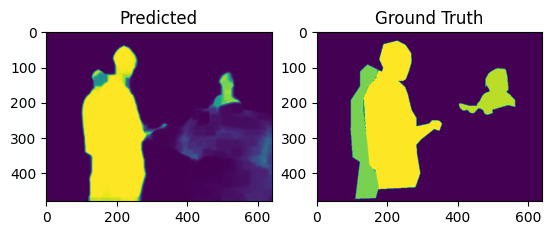

Processing Images:  22%|██▏       | 109/500 [00:54<03:37,  1.80it/s]

[1]
[2]
SPRC: nan


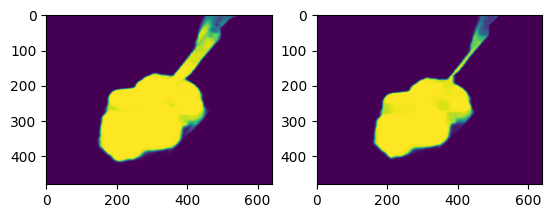

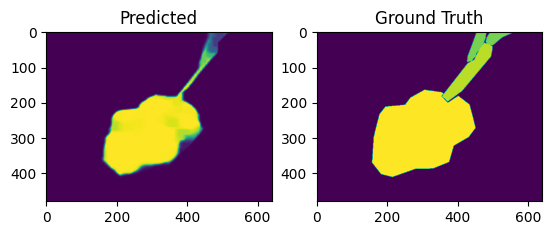

Processing Images:  22%|██▏       | 110/500 [00:54<03:46,  1.72it/s]

[1]
[3]
SPRC: nan


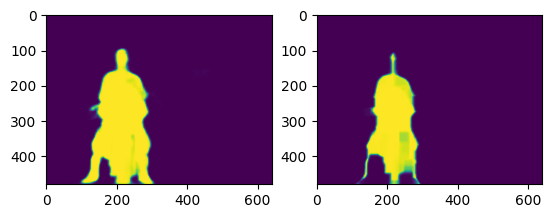

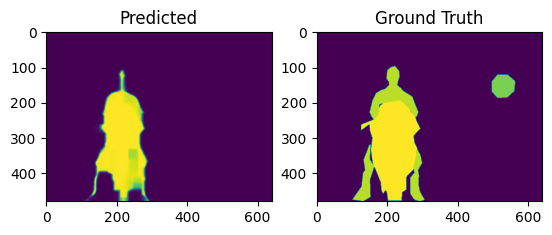

Processing Images:  22%|██▏       | 111/500 [00:55<03:53,  1.67it/s]

[1]
[2]
SPRC: nan


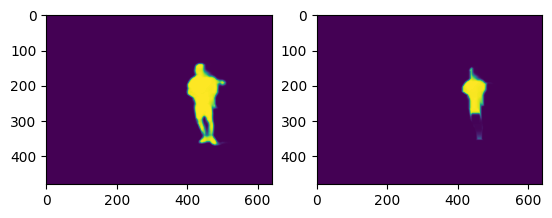

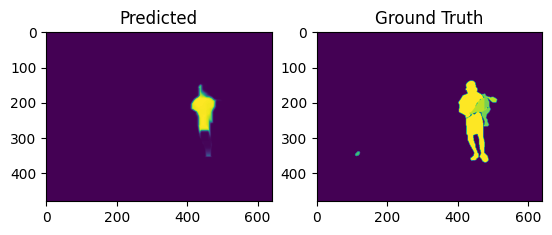

Processing Images:  22%|██▏       | 112/500 [00:56<04:01,  1.60it/s]

[1]
[3]
SPRC: nan


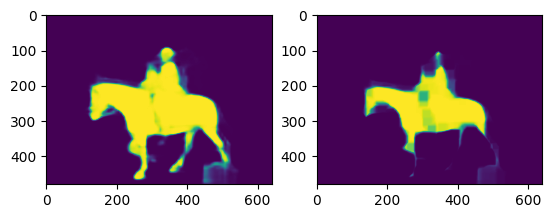

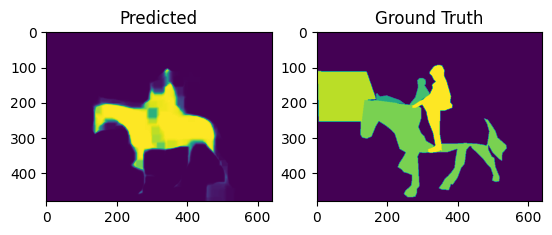

Processing Images:  23%|██▎       | 113/500 [00:56<04:26,  1.45it/s]

[1]
[1]
SPRC: nan


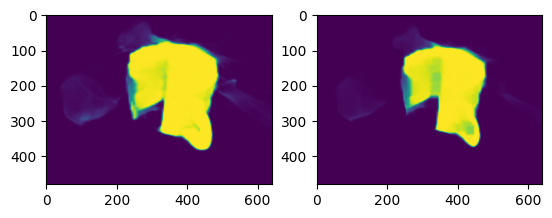

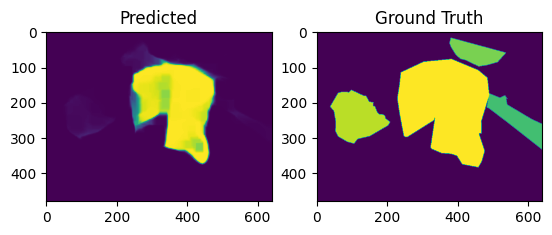

Processing Images:  23%|██▎       | 114/500 [00:57<04:51,  1.32it/s]

[1, 2]
[3, 4]
SPRC: 1.0


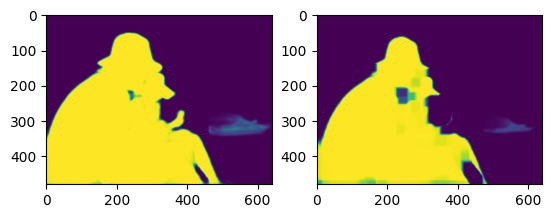

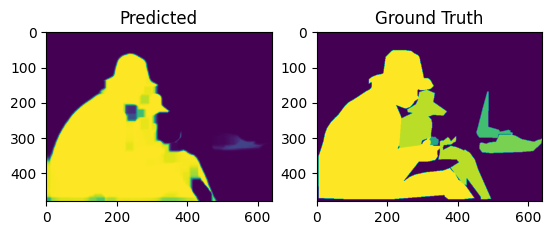

Processing Images:  23%|██▎       | 115/500 [00:58<04:13,  1.52it/s]

[1, 2]
[4, 3]
SPRC: 5.551115123125783e-17


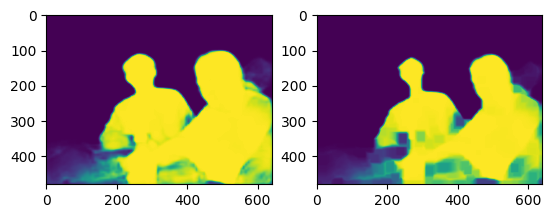

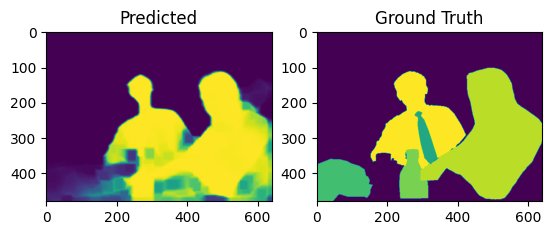

Processing Images:  23%|██▎       | 116/500 [00:58<04:13,  1.52it/s]

[1]
[3]
SPRC: nan


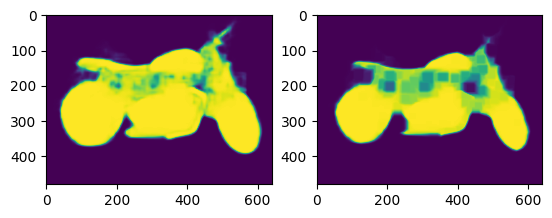

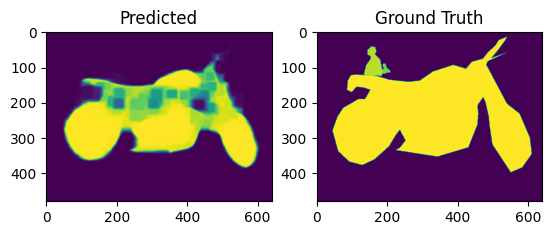

Processing Images:  23%|██▎       | 117/500 [00:59<03:45,  1.70it/s]

[1]
[3]
SPRC: nan


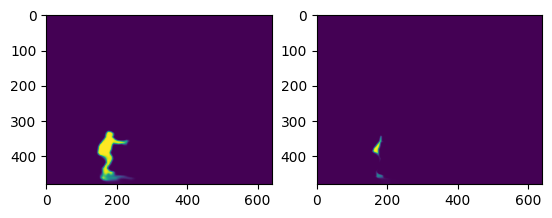

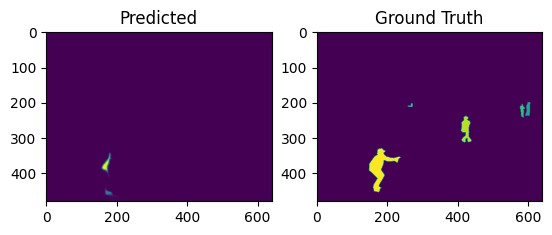

Processing Images:  24%|██▎       | 118/500 [00:59<03:47,  1.68it/s]

[1]
[3]
SPRC: nan


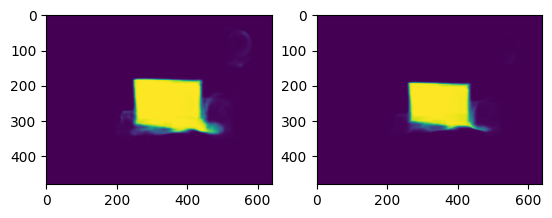

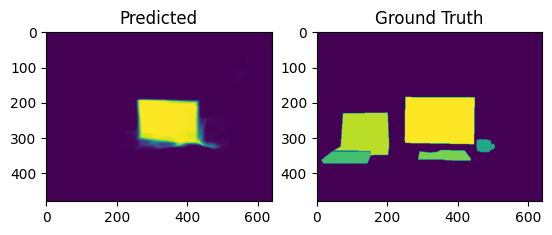

Processing Images:  24%|██▍       | 119/500 [01:00<03:32,  1.79it/s]

[1]
[5]
SPRC: nan


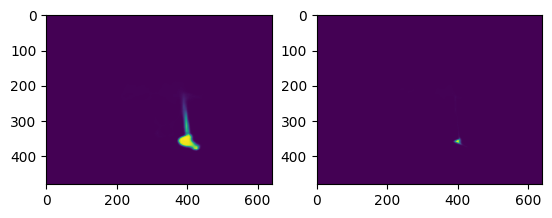

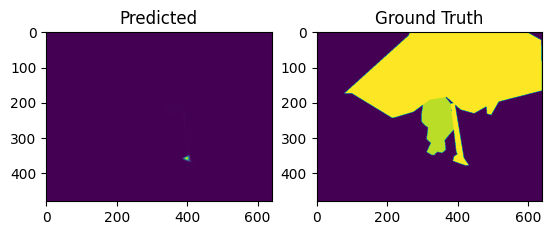

Processing Images:  24%|██▍       | 120/500 [01:00<03:34,  1.77it/s]

[1]
[1]
SPRC: nan


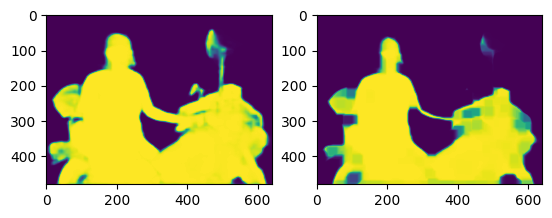

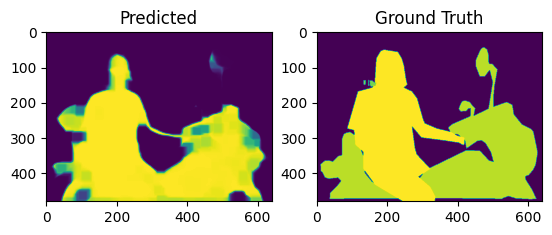

Processing Images:  24%|██▍       | 121/500 [01:01<03:43,  1.70it/s]

[1]
[1]
SPRC: nan


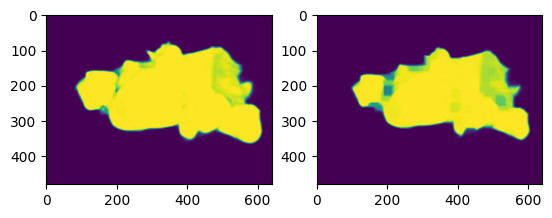

Processing Images:  24%|██▍       | 122/500 [01:01<03:01,  2.08it/s]

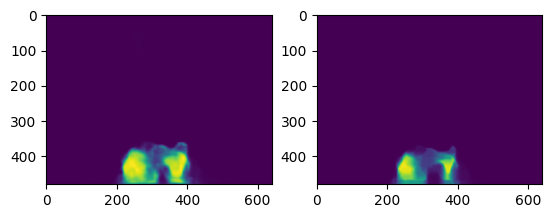

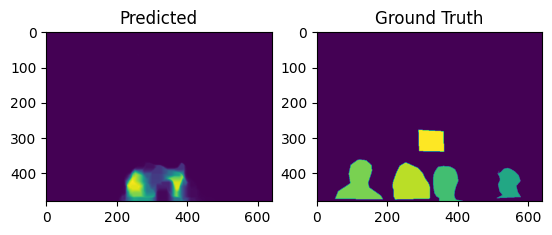

Processing Images:  25%|██▍       | 123/500 [01:02<03:42,  1.70it/s]

[1]
[3]
SPRC: nan


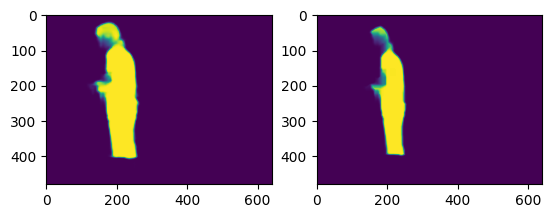

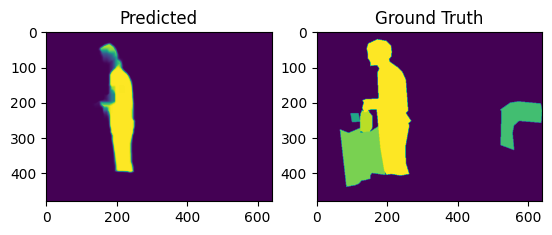

Processing Images:  25%|██▍       | 124/500 [01:03<03:26,  1.82it/s]

[1]
[5]
SPRC: nan


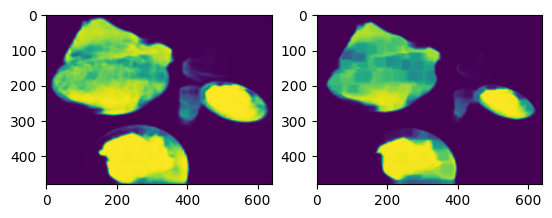

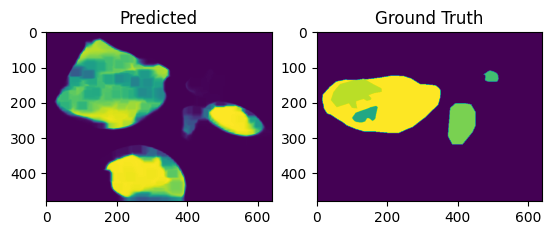

Processing Images:  25%|██▌       | 125/500 [01:03<03:41,  1.69it/s]

[1, 2]
[5, 2]
SPRC: 5.551115123125783e-17


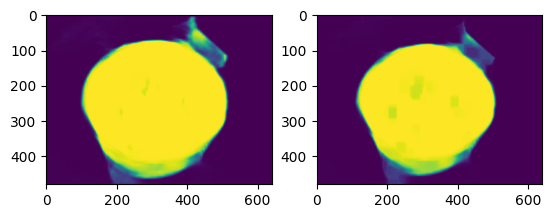

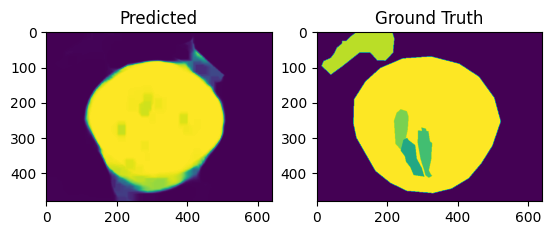

Processing Images:  25%|██▌       | 126/500 [01:04<03:49,  1.63it/s]

[1]
[3]
SPRC: nan


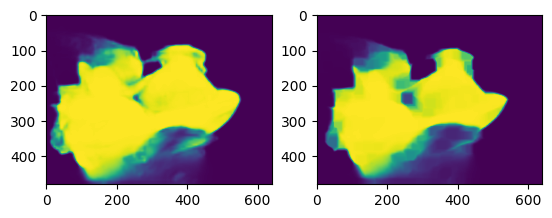

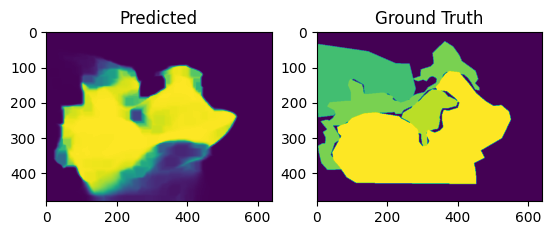

Processing Images:  25%|██▌       | 127/500 [01:04<03:27,  1.80it/s]

[1]
[1]
SPRC: nan


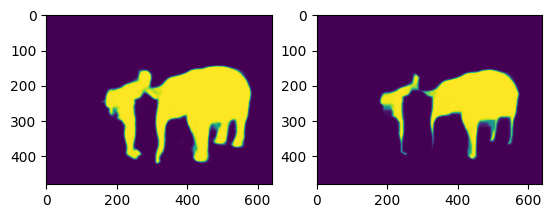

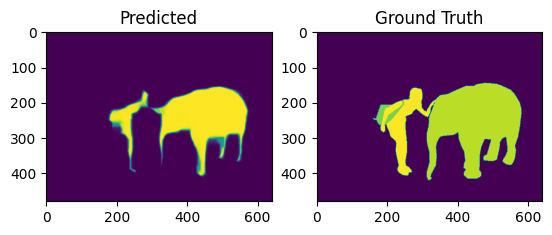

Processing Images:  26%|██▌       | 128/500 [01:05<03:50,  1.61it/s]

[1]
[1]
SPRC: nan


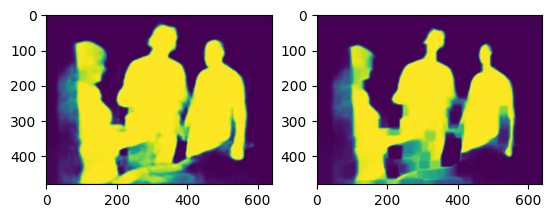

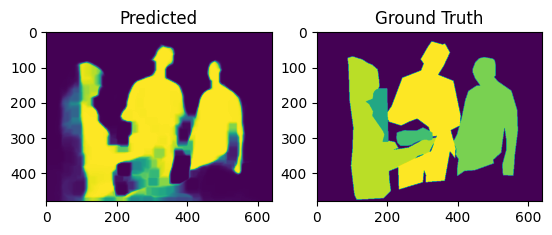

Processing Images:  26%|██▌       | 129/500 [01:06<03:38,  1.70it/s]

[1]
[2]
SPRC: nan


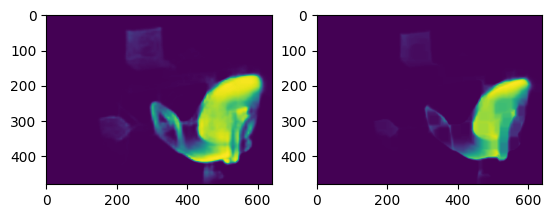

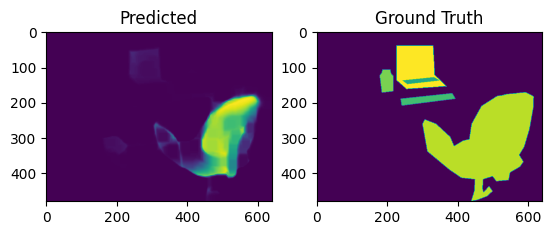

Processing Images:  26%|██▌       | 130/500 [01:06<03:52,  1.59it/s]

[1]
[3]
SPRC: nan


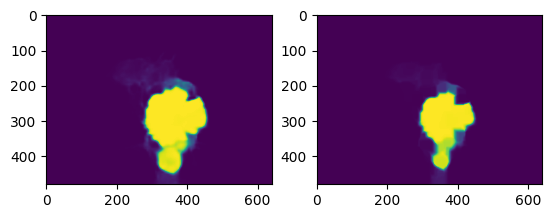

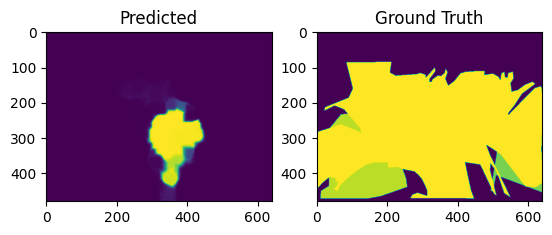

Processing Images:  26%|██▌       | 131/500 [01:07<04:05,  1.51it/s]

[1]
[3]
SPRC: nan


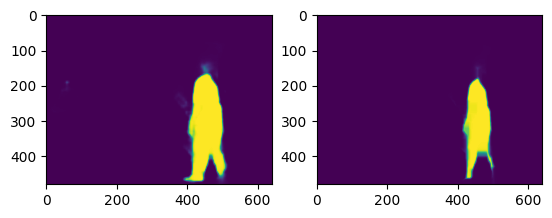

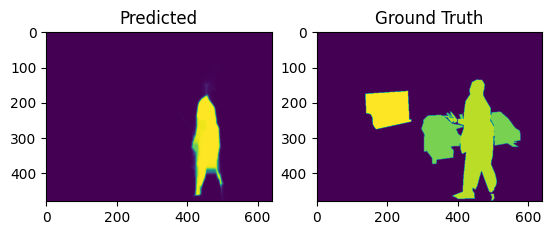

Processing Images:  26%|██▋       | 132/500 [01:09<05:24,  1.13it/s]

[1]
[1]
SPRC: nan


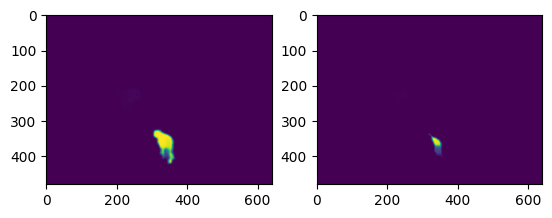

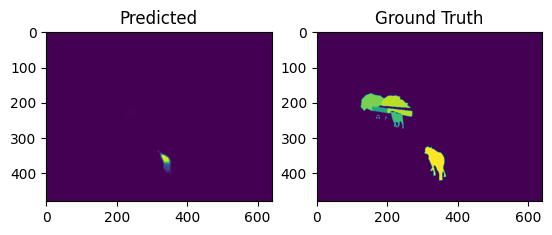

Processing Images:  27%|██▋       | 133/500 [01:09<04:32,  1.35it/s]

[2, 1]
[2, 5]
SPRC: 5.551115123125783e-17


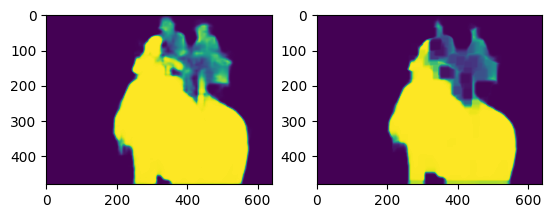

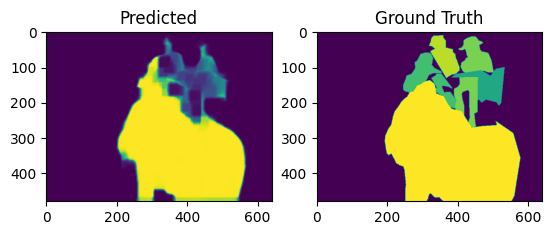

Processing Images:  27%|██▋       | 134/500 [01:10<04:20,  1.40it/s]

[1]
[2]
SPRC: nan


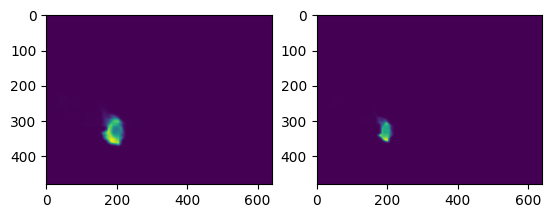

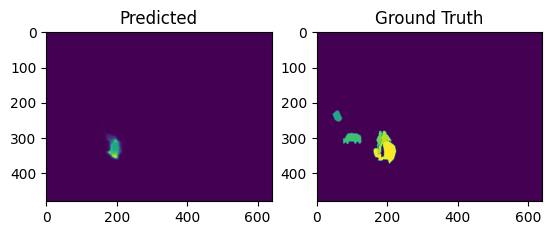

Processing Images:  27%|██▋       | 135/500 [01:10<04:11,  1.45it/s]

[2, 1]
[1, 5]
SPRC: 5.551115123125783e-17


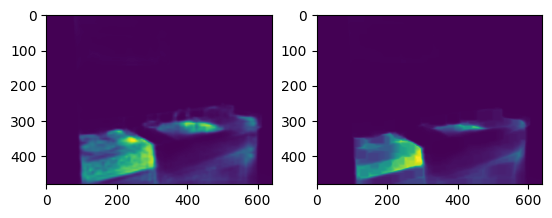

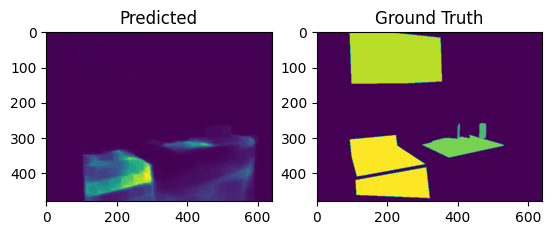

Processing Images:  27%|██▋       | 136/500 [01:11<04:03,  1.49it/s]

[2, 1]
[4, 5]
SPRC: 5.551115123125783e-17


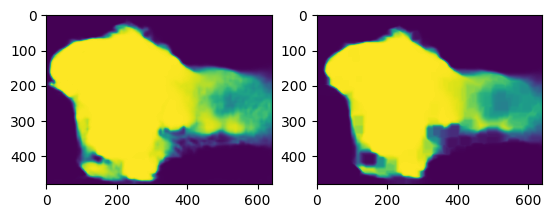

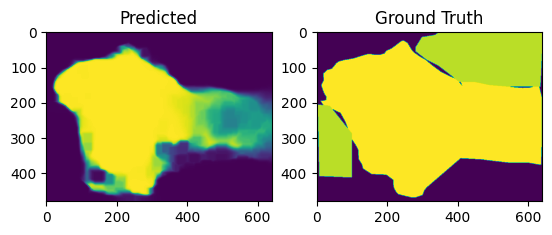

Processing Images:  27%|██▋       | 137/500 [01:12<04:04,  1.49it/s]

[1]
[2]
SPRC: nan


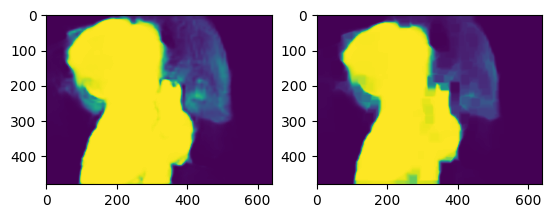

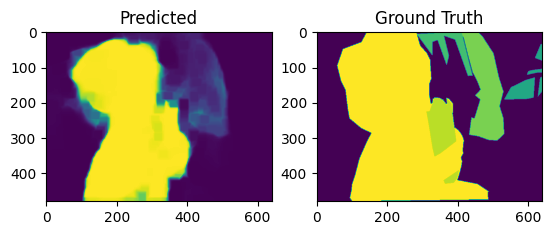

Processing Images:  28%|██▊       | 138/500 [01:12<03:58,  1.52it/s]

[1]
[5]
SPRC: nan


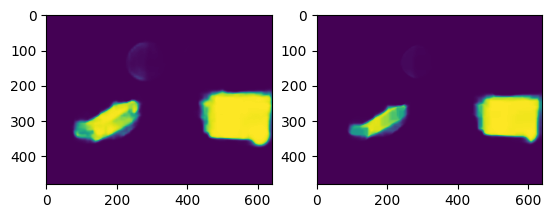

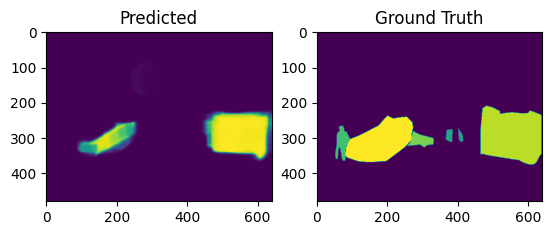

Processing Images:  28%|██▊       | 139/500 [01:13<04:06,  1.46it/s]

[1, 2]
[3, 5]
SPRC: 1.0


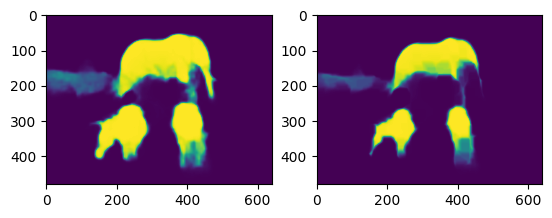

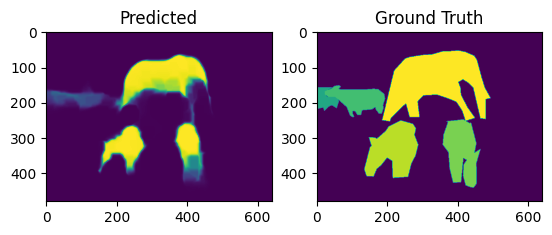

Processing Images:  28%|██▊       | 140/500 [01:14<04:16,  1.40it/s]

[1]
[3]
SPRC: nan


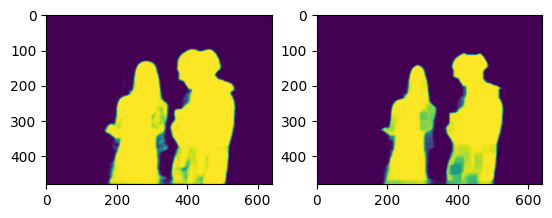

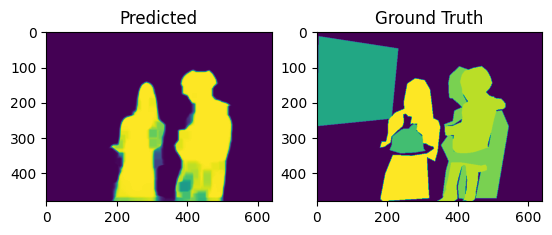

Processing Images:  28%|██▊       | 141/500 [01:14<03:54,  1.53it/s]

[1]
[2]
SPRC: nan


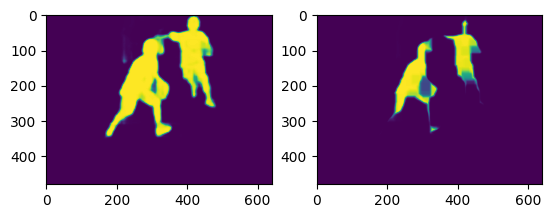

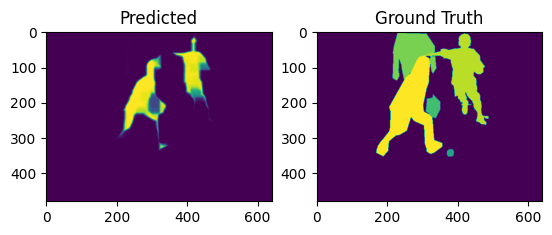

Processing Images:  28%|██▊       | 142/500 [01:15<03:47,  1.58it/s]

[2, 1]
[3, 4]
SPRC: 5.551115123125783e-17


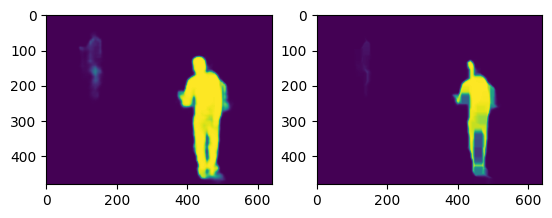

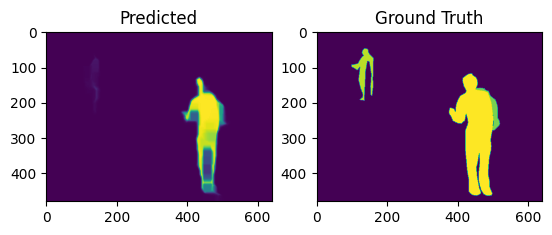

Processing Images:  29%|██▊       | 143/500 [01:15<03:35,  1.66it/s]

[2, 1]
[2, 3]
SPRC: 5.551115123125783e-17


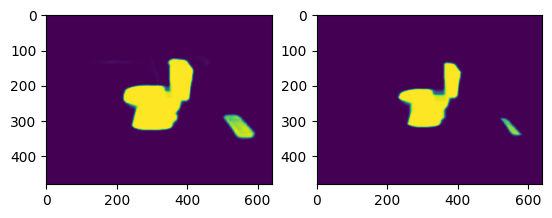

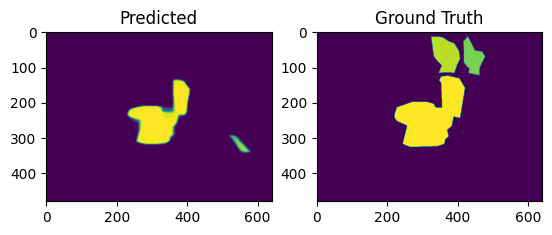

Processing Images:  29%|██▉       | 144/500 [01:16<03:34,  1.66it/s]

[1]
[3]
SPRC: nan


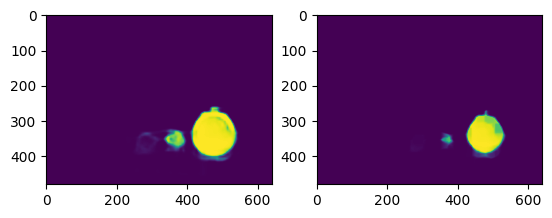

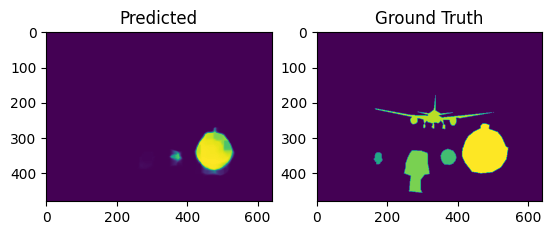

Processing Images:  29%|██▉       | 145/500 [01:16<03:26,  1.72it/s]

[1, 3, 2]
[5, 3, 2]
SPRC: 0.25


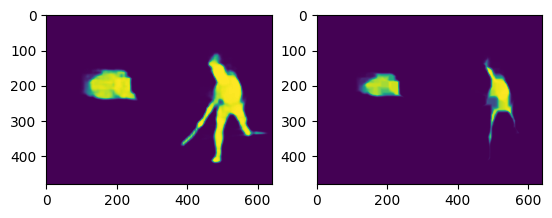

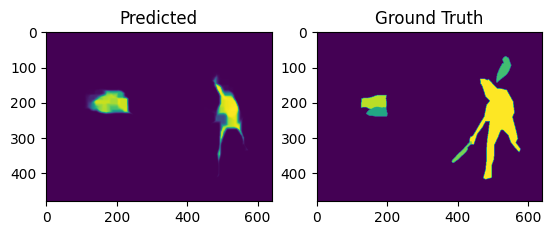

Processing Images:  29%|██▉       | 146/500 [01:17<03:29,  1.69it/s]

[1, 2]
[3, 1]
SPRC: 5.551115123125783e-17


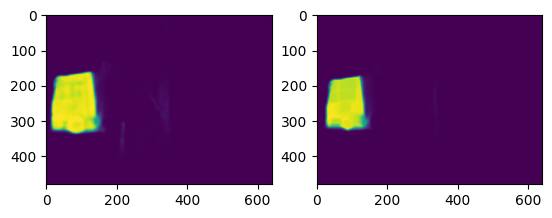

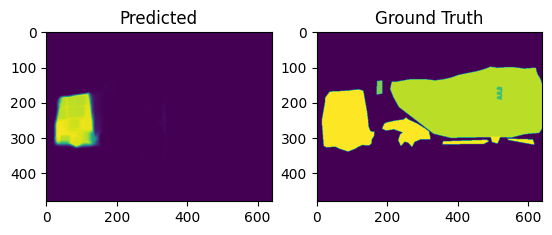

Processing Images:  29%|██▉       | 147/500 [01:18<03:30,  1.68it/s]

[1]
[4]
SPRC: nan


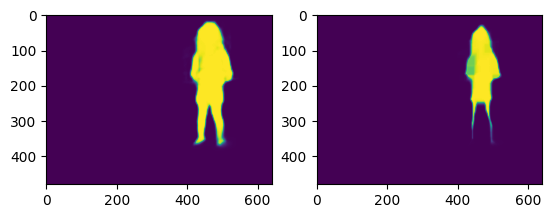

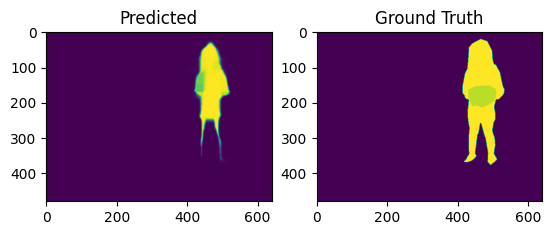

Processing Images:  30%|██▉       | 148/500 [01:18<03:22,  1.74it/s]

[1]
[1]
SPRC: nan


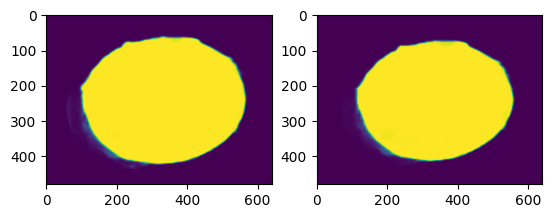

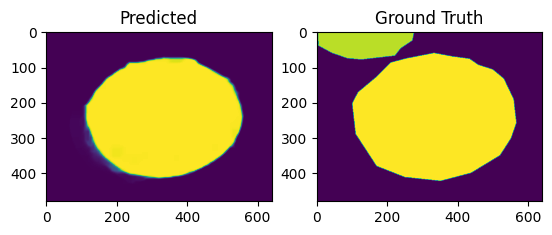

Processing Images:  30%|██▉       | 149/500 [01:19<03:26,  1.70it/s]

[1]
[2]
SPRC: nan


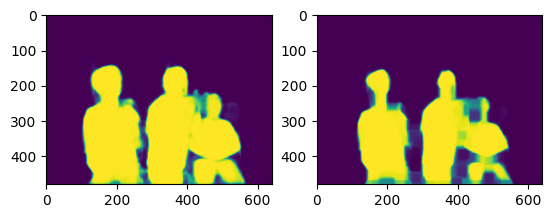

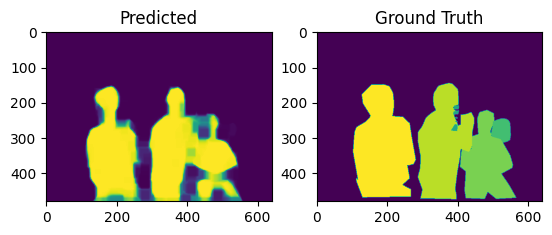

Processing Images:  30%|███       | 150/500 [01:19<03:17,  1.77it/s]

[1]
[3]
SPRC: nan


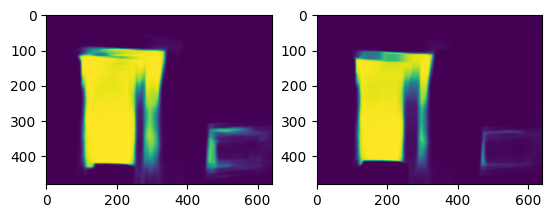

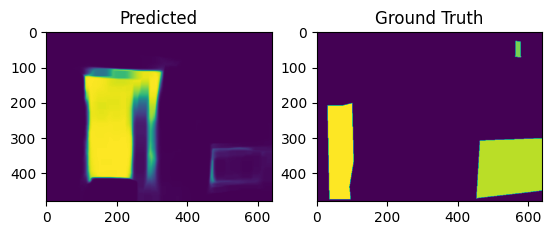

Processing Images:  30%|███       | 151/500 [01:20<03:29,  1.67it/s]

[1]
[1]
SPRC: nan


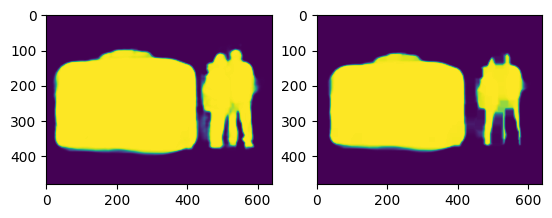

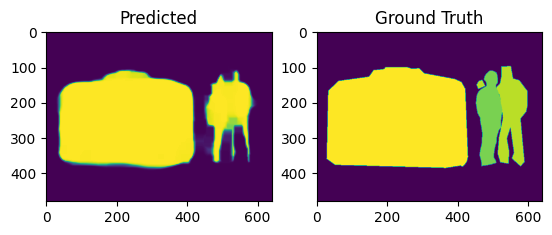

Processing Images:  30%|███       | 152/500 [01:21<03:28,  1.67it/s]

[1]
[2]
SPRC: nan


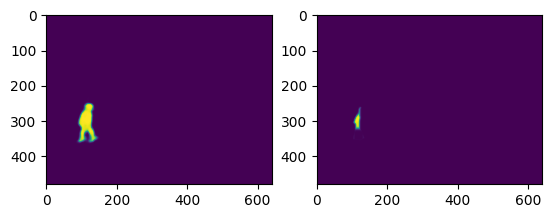

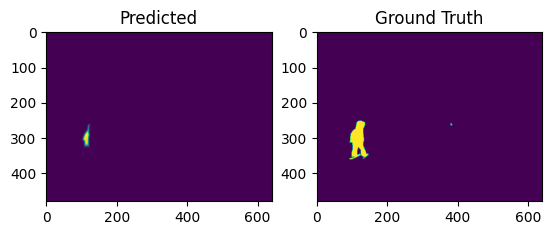

Processing Images:  31%|███       | 153/500 [01:21<03:38,  1.59it/s]

[1]
[3]
SPRC: nan


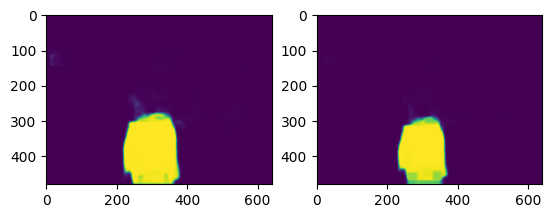

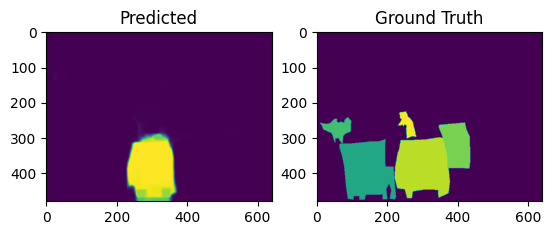

Processing Images:  31%|███       | 154/500 [01:22<03:32,  1.62it/s]

[1]
[4]
SPRC: nan


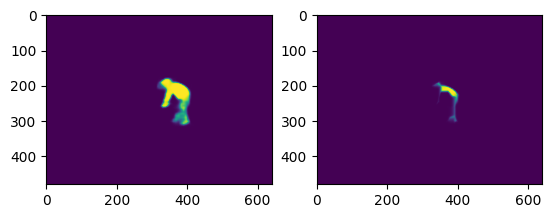

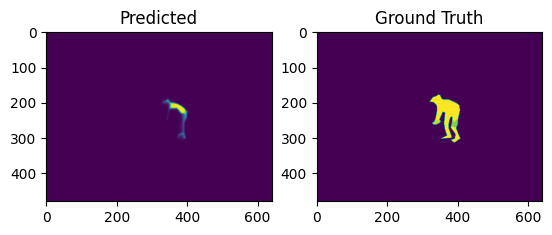

Processing Images:  31%|███       | 155/500 [01:23<03:33,  1.62it/s]

[1]
[2]
SPRC: nan


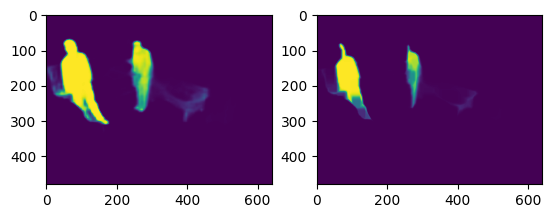

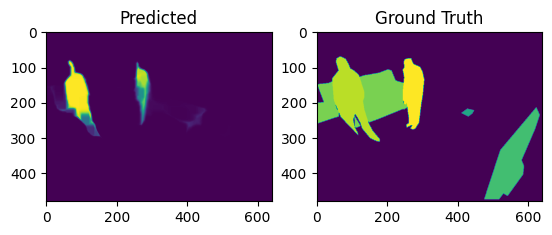

Processing Images:  31%|███       | 156/500 [01:23<03:40,  1.56it/s]

[2, 1]
[1, 5]
SPRC: 5.551115123125783e-17


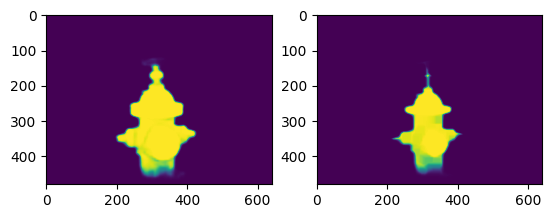

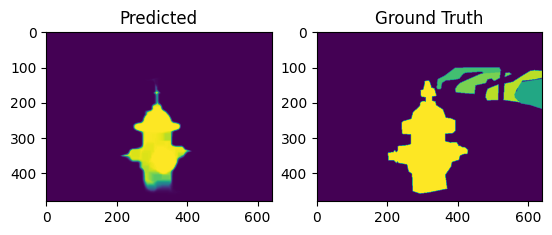

Processing Images:  31%|███▏      | 157/500 [01:24<03:28,  1.65it/s]

[1]
[4]
SPRC: nan


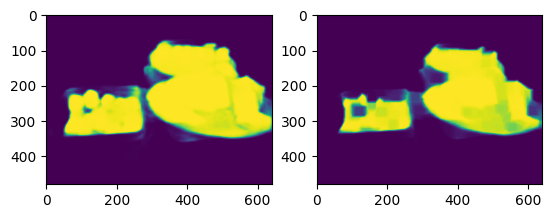

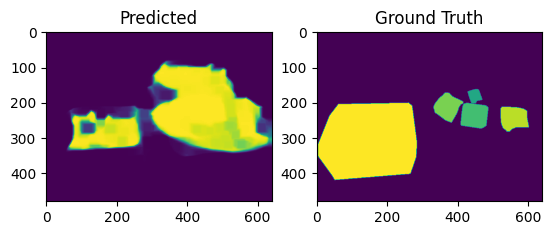

Processing Images:  32%|███▏      | 158/500 [01:25<04:20,  1.31it/s]

[1]
[5]
SPRC: nan


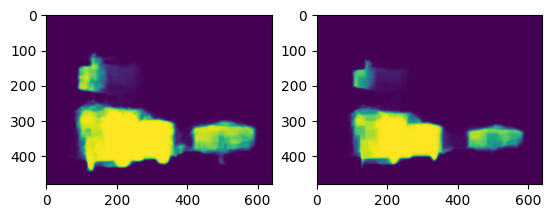

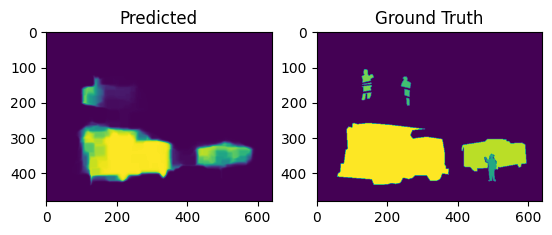

Processing Images:  32%|███▏      | 159/500 [01:25<03:42,  1.53it/s]

[1]
[5]
SPRC: nan


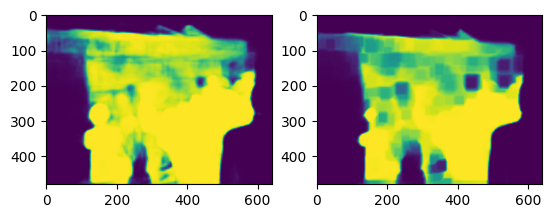

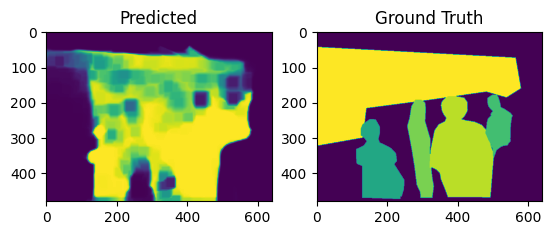

Processing Images:  32%|███▏      | 160/500 [01:26<03:41,  1.54it/s]

[1]
[3]
SPRC: nan


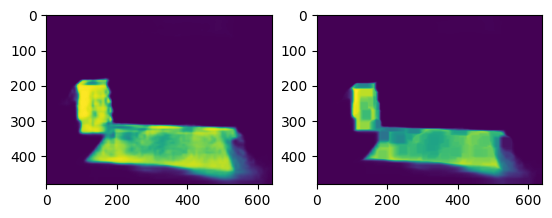

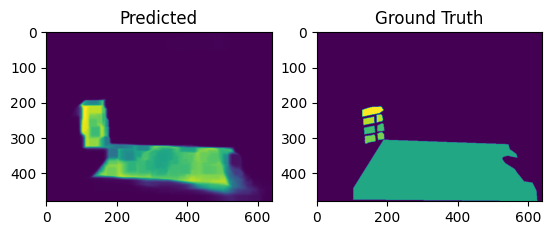

Processing Images:  32%|███▏      | 161/500 [01:26<03:29,  1.62it/s]

[1]
[5]
SPRC: nan


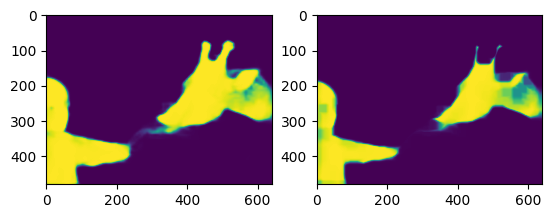

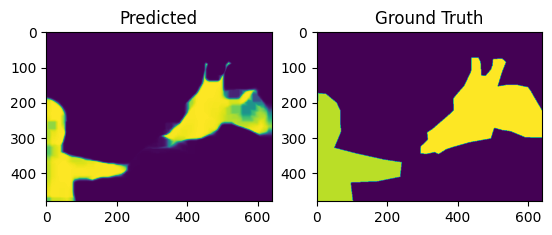

Processing Images:  32%|███▏      | 162/500 [01:27<03:34,  1.58it/s]

[1]
[1]
SPRC: nan


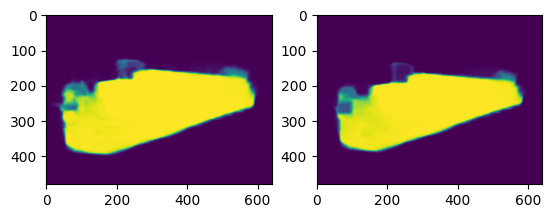

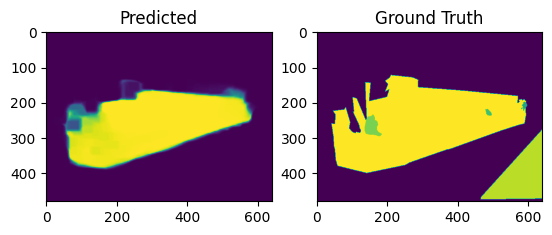

Processing Images:  33%|███▎      | 163/500 [01:28<03:27,  1.63it/s]

[1]
[5]
SPRC: nan


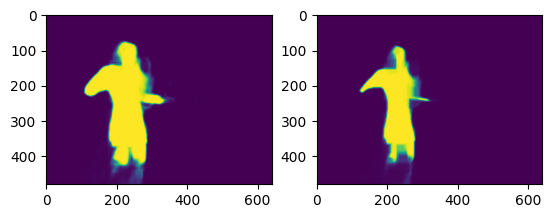

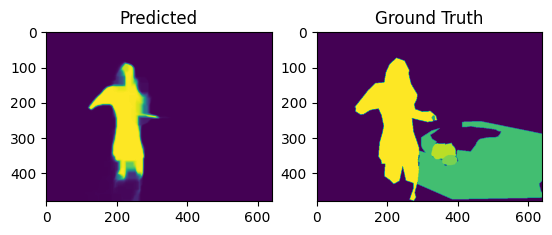

Processing Images:  33%|███▎      | 164/500 [01:28<03:24,  1.64it/s]

[1]
[5]
SPRC: nan


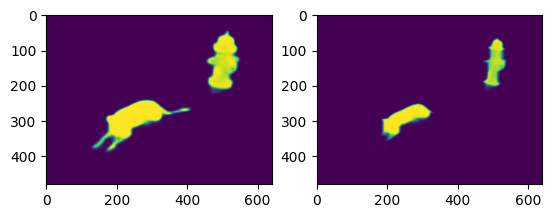

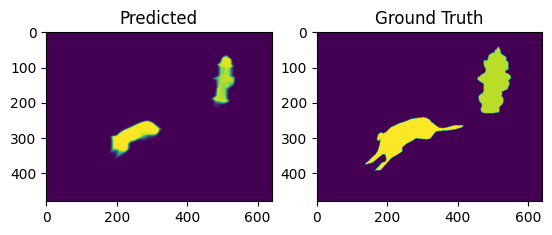

Processing Images:  33%|███▎      | 165/500 [01:29<03:17,  1.69it/s]

[2, 1]
[1, 2]
SPRC: 5.551115123125783e-17


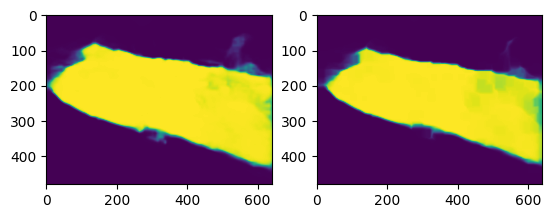

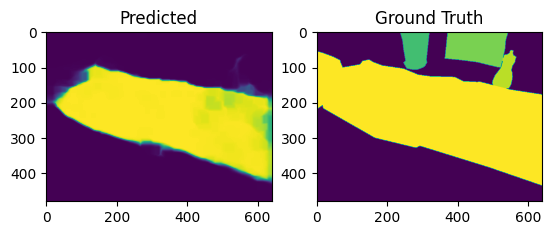

Processing Images:  33%|███▎      | 166/500 [01:30<03:25,  1.63it/s]

[1]
[2]
SPRC: nan


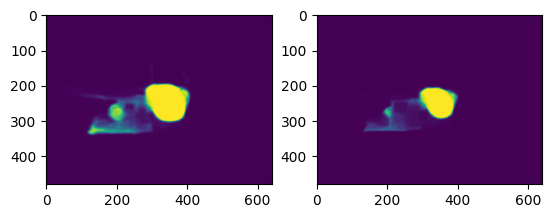

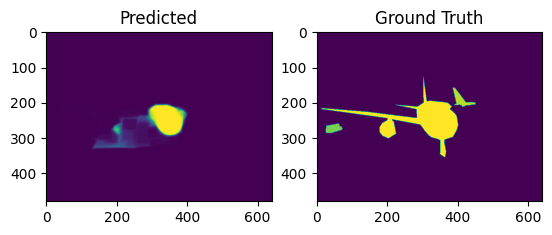

Processing Images:  33%|███▎      | 167/500 [01:30<03:20,  1.66it/s]

[1]
[3]
SPRC: nan


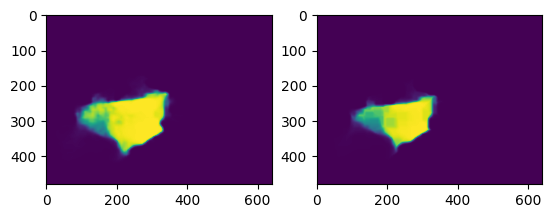

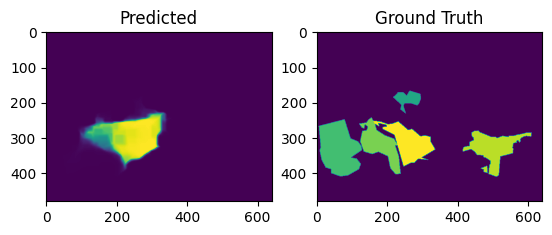

Processing Images:  34%|███▎      | 168/500 [01:31<03:28,  1.60it/s]

[1]
[2]
SPRC: nan


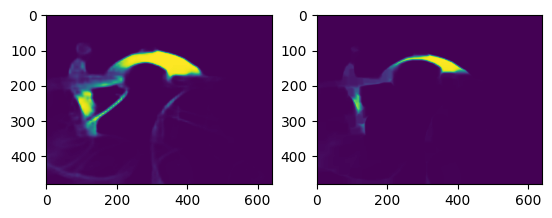

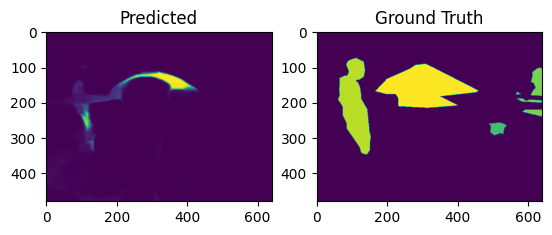

Processing Images:  34%|███▍      | 169/500 [01:31<03:24,  1.62it/s]

[1]
[3]
SPRC: nan


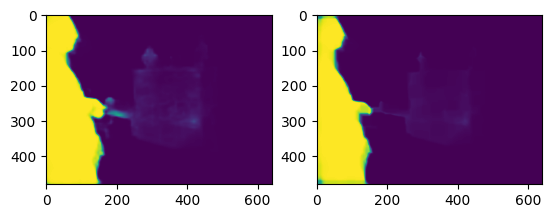

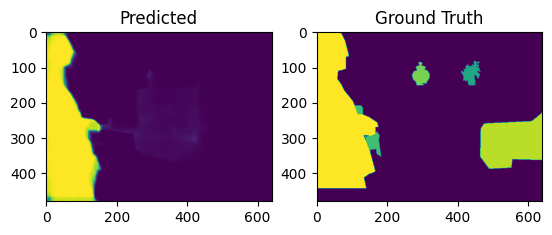

Processing Images:  34%|███▍      | 170/500 [01:32<03:31,  1.56it/s]

[1]
[3]
SPRC: nan


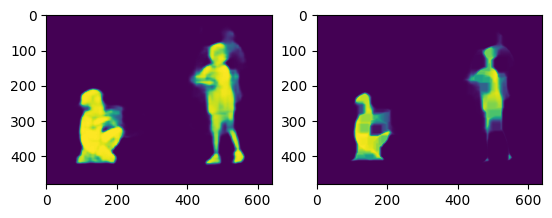

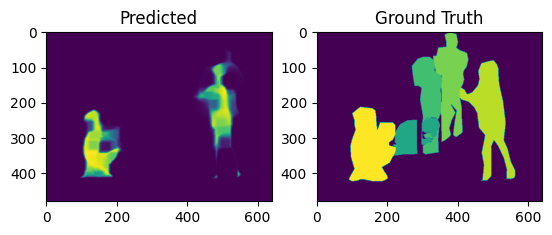

Processing Images:  34%|███▍      | 171/500 [01:33<03:41,  1.49it/s]

[1, 2]
[4, 5]
SPRC: 1.0


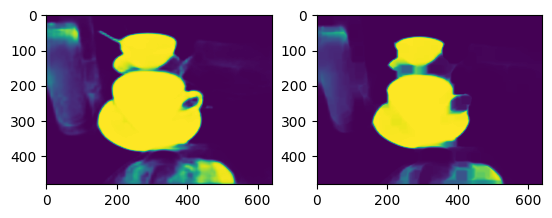

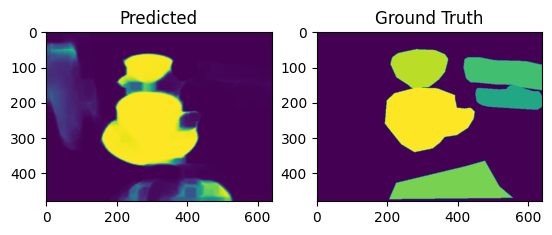

Processing Images:  34%|███▍      | 172/500 [01:34<04:30,  1.21it/s]

[1]
[4]
SPRC: nan


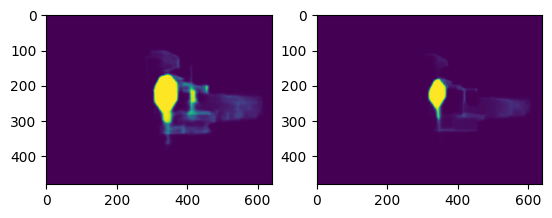

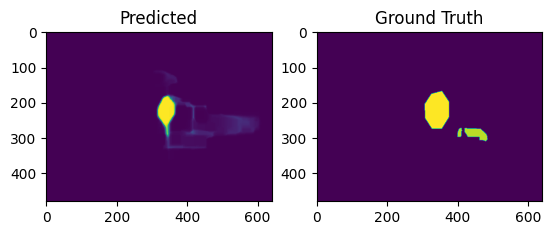

Processing Images:  35%|███▍      | 173/500 [01:35<04:15,  1.28it/s]

[1]
[2]
SPRC: nan


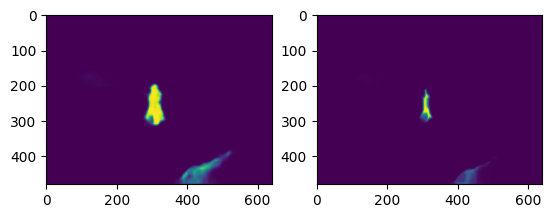

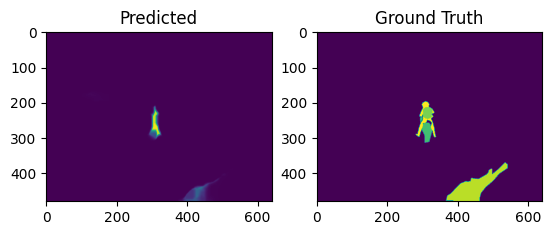

Processing Images:  35%|███▍      | 174/500 [01:35<03:58,  1.37it/s]

[2, 1]
[2, 4]
SPRC: 5.551115123125783e-17


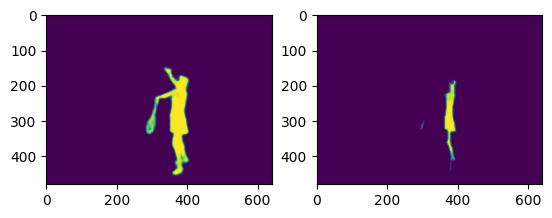

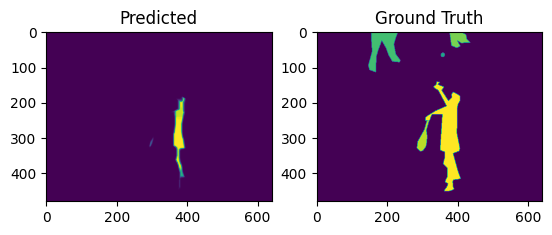

Processing Images:  35%|███▌      | 175/500 [01:36<03:50,  1.41it/s]

[1, 2]
[5, 2]
SPRC: 5.551115123125783e-17


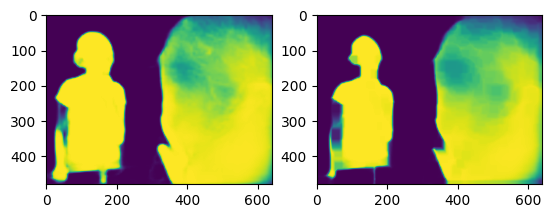

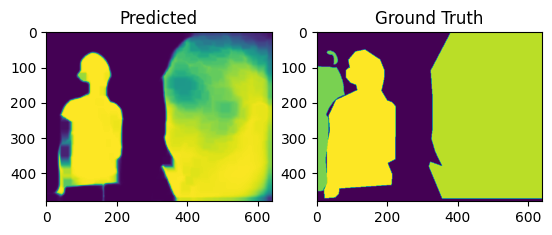

Processing Images:  35%|███▌      | 176/500 [01:37<03:38,  1.48it/s]

[1, 2]
[1, 3]
SPRC: 1.0


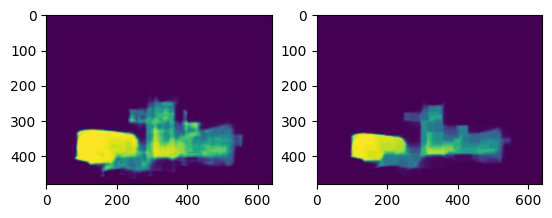

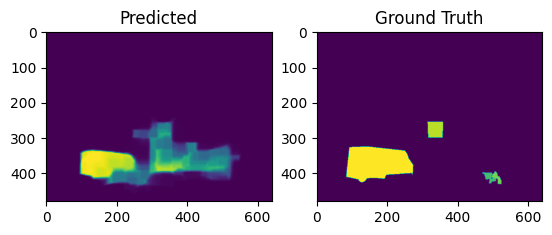

Processing Images:  35%|███▌      | 177/500 [01:37<03:34,  1.51it/s]

[1]
[3]
SPRC: nan


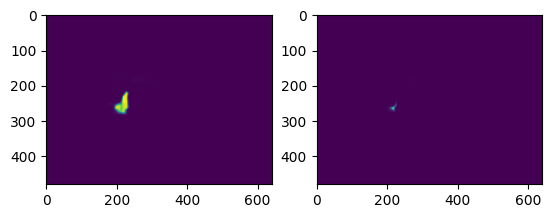

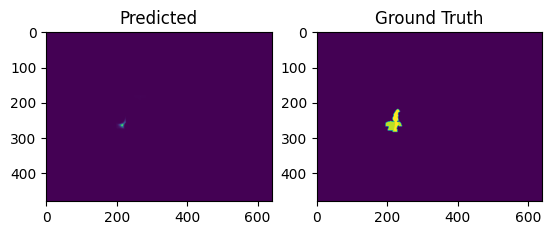

Processing Images:  36%|███▌      | 178/500 [01:38<03:29,  1.54it/s]

[1]
[2]
SPRC: nan


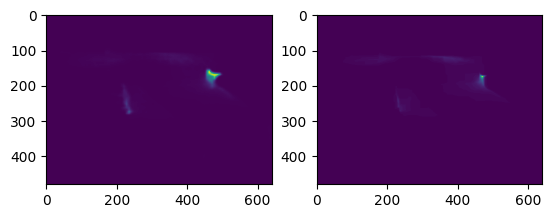

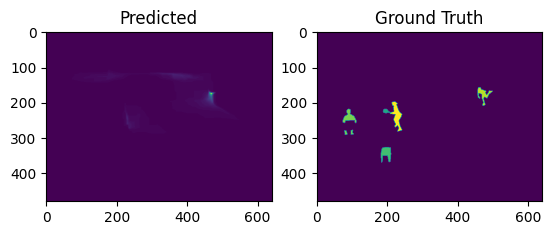

Processing Images:  36%|███▌      | 179/500 [01:38<03:28,  1.54it/s]

[1]
[5]
SPRC: nan


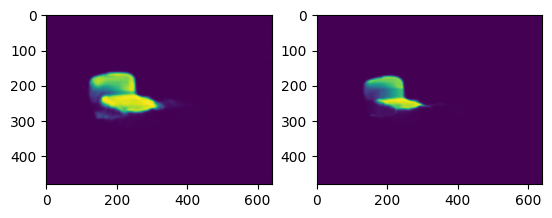

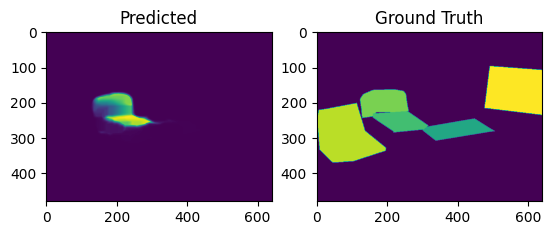

Processing Images:  36%|███▌      | 180/500 [01:39<03:27,  1.54it/s]

[1]
[1]
SPRC: nan


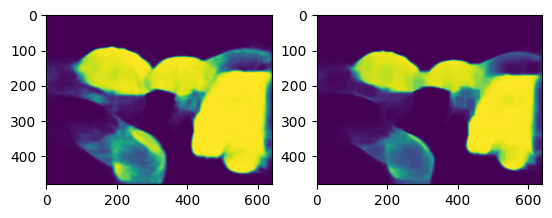

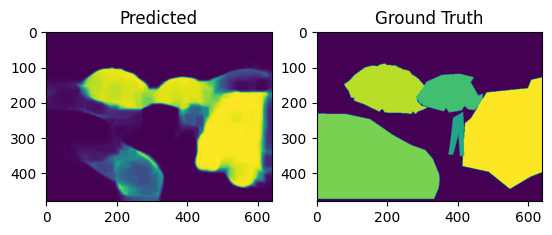

Processing Images:  36%|███▌      | 181/500 [01:40<03:35,  1.48it/s]

[1]
[2]
SPRC: nan


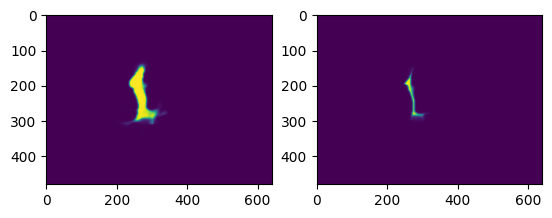

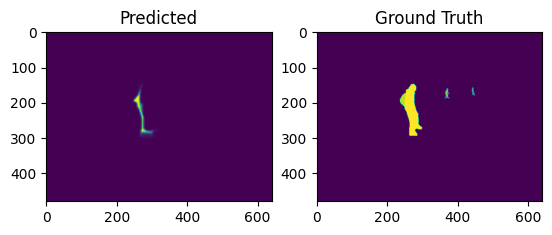

Processing Images:  36%|███▋      | 182/500 [01:40<03:09,  1.68it/s]

[1]
[5]
SPRC: nan


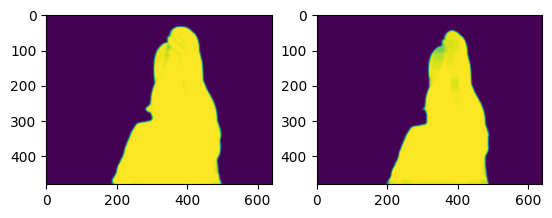

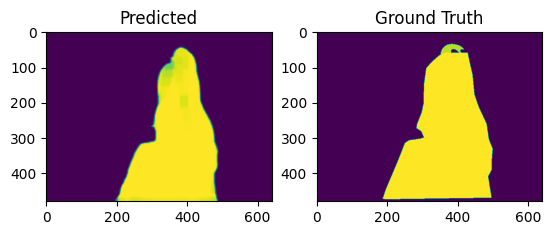

Processing Images:  37%|███▋      | 183/500 [01:41<03:07,  1.69it/s]

[1]
[2]
SPRC: nan


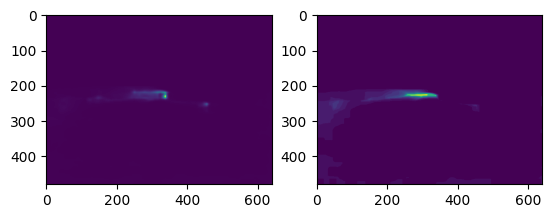

Processing Images:  37%|███▋      | 184/500 [01:42<03:48,  1.39it/s]

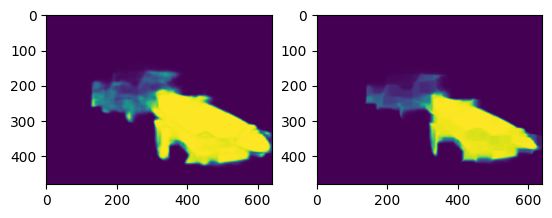

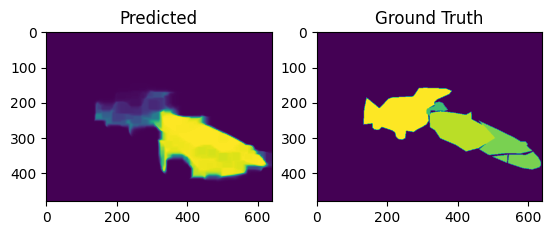

Processing Images:  37%|███▋      | 185/500 [01:43<03:46,  1.39it/s]

[1]
[2]
SPRC: nan


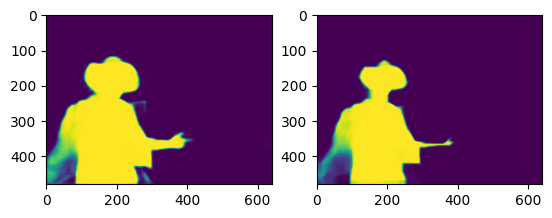

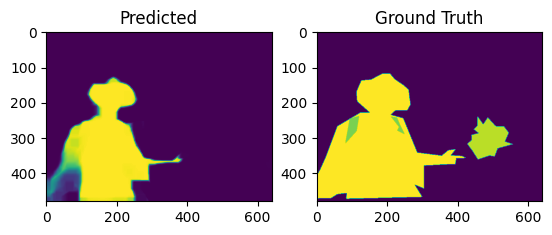

Processing Images:  37%|███▋      | 186/500 [01:43<03:24,  1.54it/s]

[1]
[3]
SPRC: nan


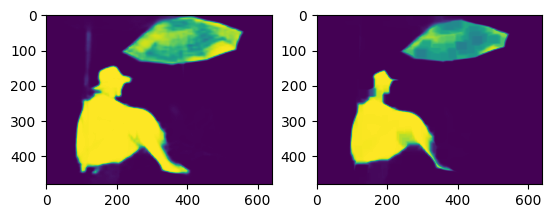

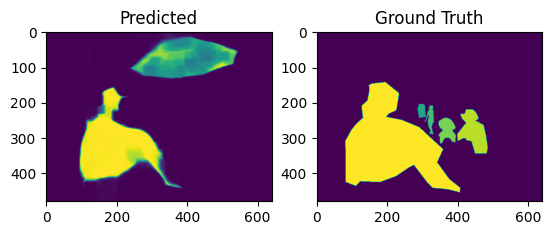

Processing Images:  37%|███▋      | 187/500 [01:44<03:17,  1.59it/s]

[1]
[5]
SPRC: nan


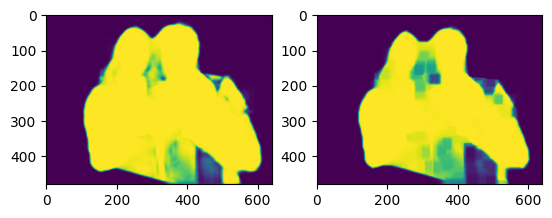

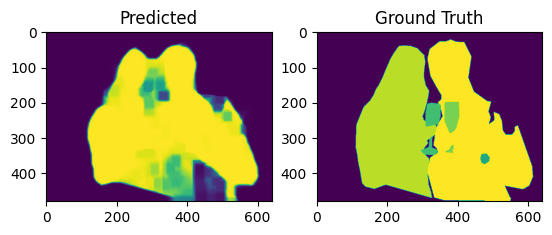

Processing Images:  38%|███▊      | 188/500 [01:44<03:20,  1.55it/s]

[1]
[3]
SPRC: nan


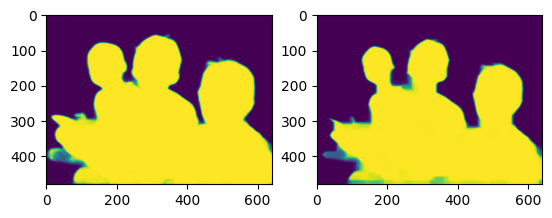

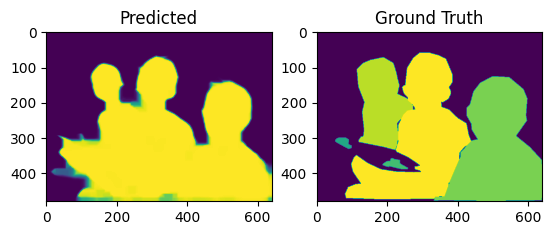

Processing Images:  38%|███▊      | 189/500 [01:45<03:05,  1.68it/s]

[1]
[2]
SPRC: nan


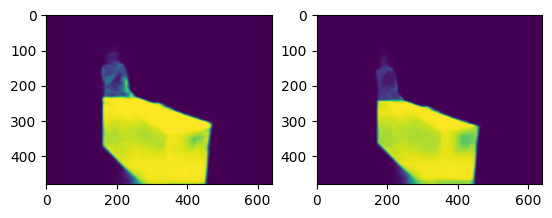

Processing Images:  38%|███▊      | 190/500 [01:45<02:30,  2.06it/s]

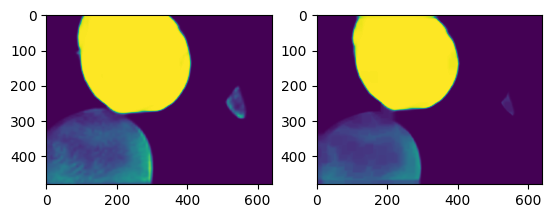

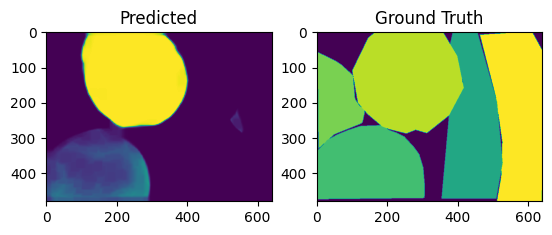

Processing Images:  38%|███▊      | 191/500 [01:46<02:40,  1.93it/s]

[1]
[1]
SPRC: nan


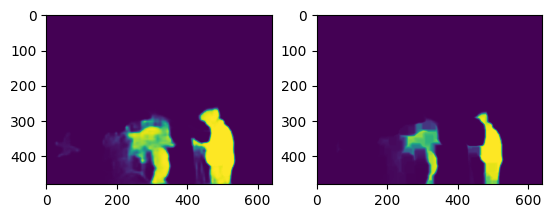

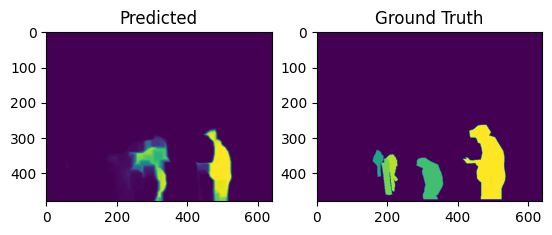

Processing Images:  38%|███▊      | 192/500 [01:46<02:53,  1.78it/s]

[2, 1]
[5, 4]
SPRC: 1.0


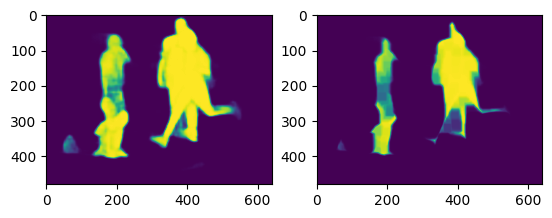

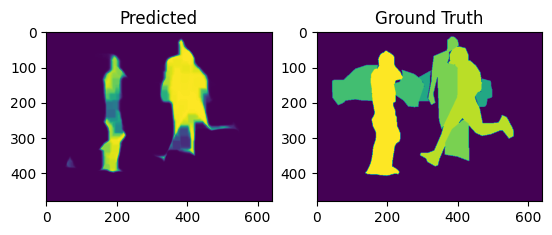

Processing Images:  39%|███▊      | 193/500 [01:47<02:47,  1.84it/s]

[1, 2]
[3, 5]
SPRC: 1.0


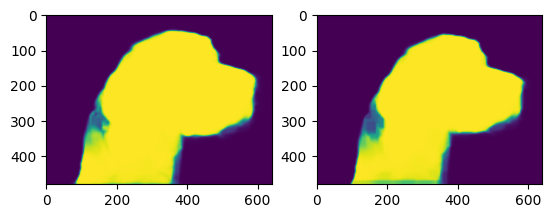

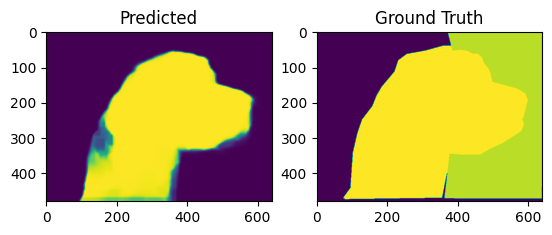

Processing Images:  39%|███▉      | 194/500 [01:47<02:55,  1.74it/s]

[1]
[2]
SPRC: nan


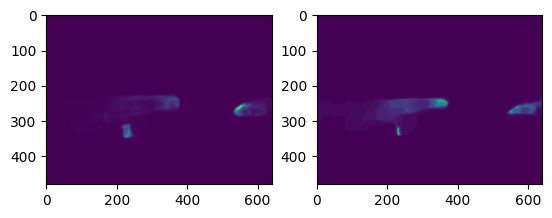

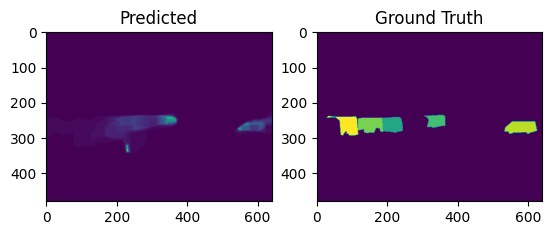

Processing Images:  39%|███▉      | 195/500 [01:48<02:53,  1.76it/s]

[1, 2]
[3, 5]
SPRC: 1.0


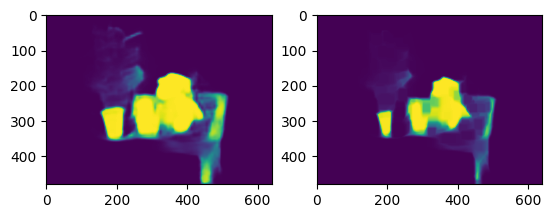

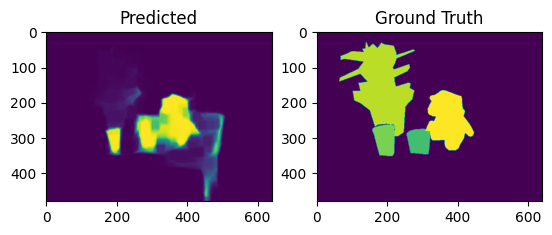

Processing Images:  39%|███▉      | 196/500 [01:49<02:56,  1.72it/s]

[1]
[3]
SPRC: nan


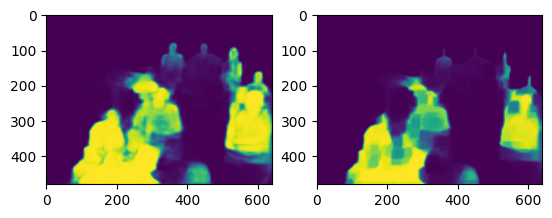

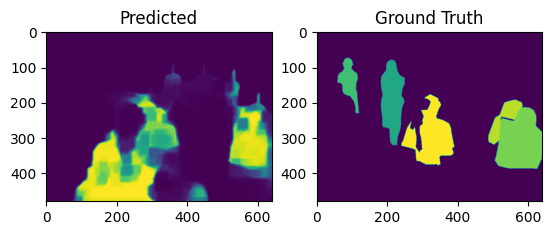

Processing Images:  39%|███▉      | 197/500 [01:49<02:50,  1.77it/s]

[1]
[5]
SPRC: nan


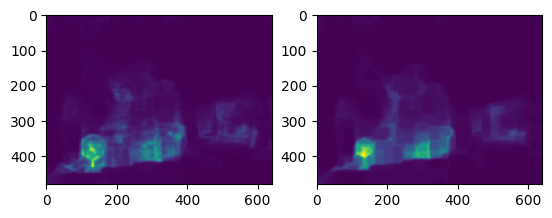

Processing Images:  40%|███▉      | 198/500 [01:49<02:22,  2.12it/s]

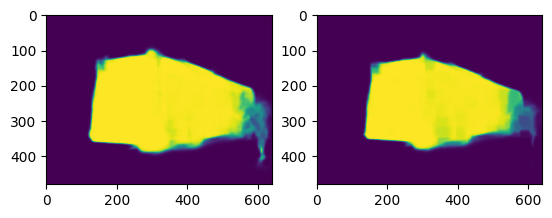

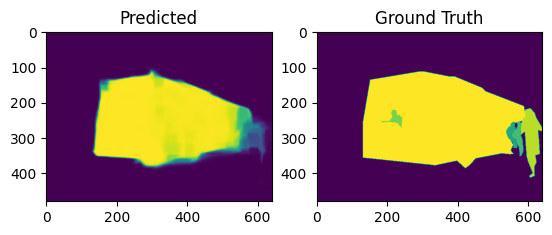

Processing Images:  40%|███▉      | 199/500 [01:50<02:35,  1.94it/s]

[1]
[3]
SPRC: nan


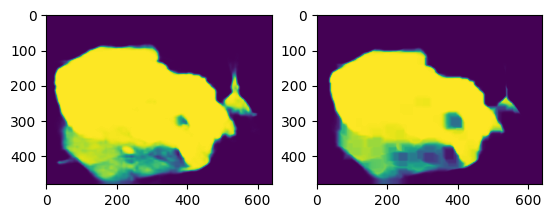

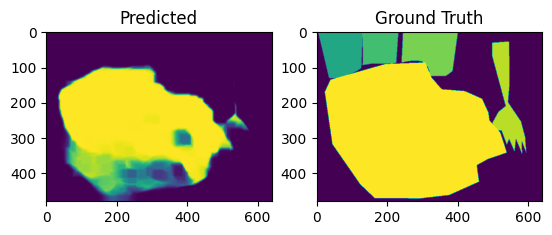

Processing Images:  40%|████      | 200/500 [01:51<02:36,  1.92it/s]

[1]
[4]
SPRC: nan


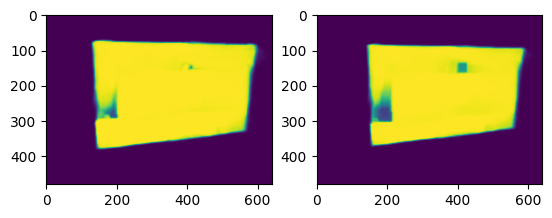

Processing Images:  40%|████      | 201/500 [01:51<02:07,  2.34it/s]

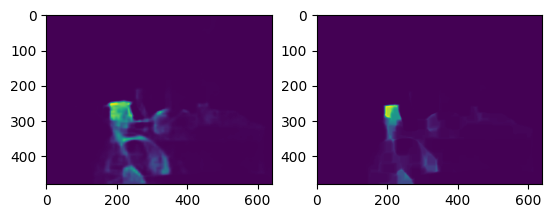

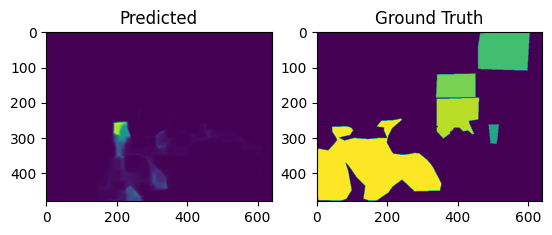

Processing Images:  40%|████      | 202/500 [01:51<02:27,  2.02it/s]

[1]
[5]
SPRC: nan


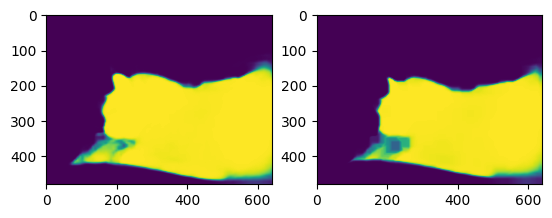

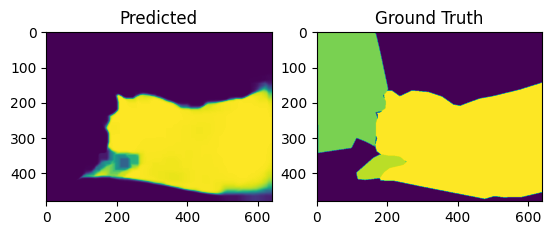

Processing Images:  41%|████      | 203/500 [01:52<02:29,  1.98it/s]

[1]
[2]
SPRC: nan


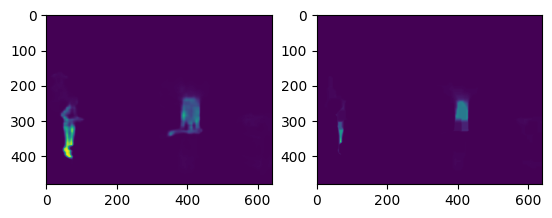

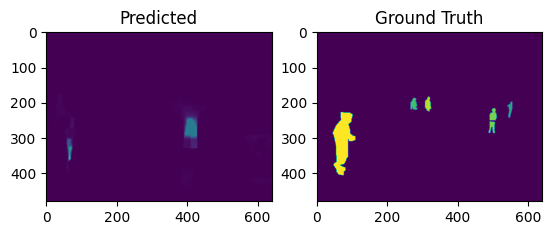

Processing Images:  41%|████      | 204/500 [01:53<02:42,  1.82it/s]

[1]
[5]
SPRC: nan


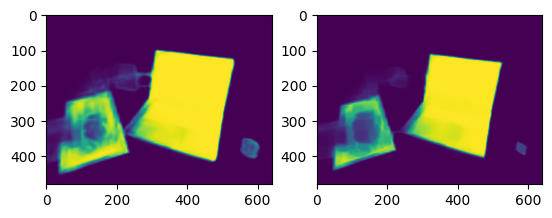

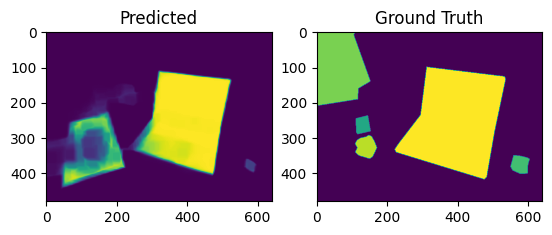

Processing Images:  41%|████      | 205/500 [01:53<02:43,  1.80it/s]

[1, 2]
[5, 3]
SPRC: 5.551115123125783e-17


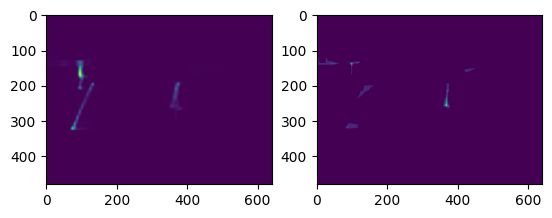

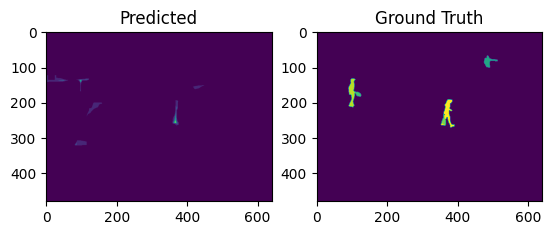

Processing Images:  41%|████      | 206/500 [01:54<02:51,  1.72it/s]

[2, 1]
[3, 5]
SPRC: 5.551115123125783e-17


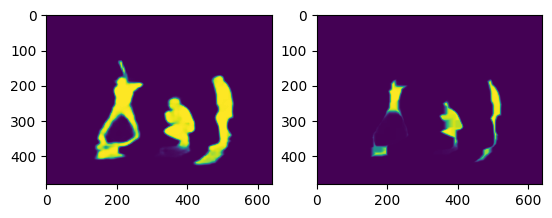

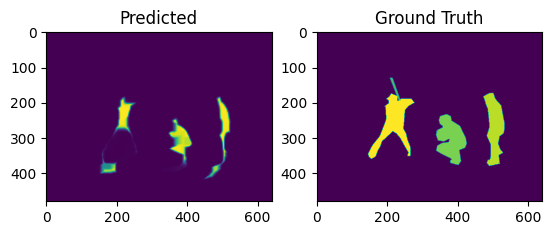

Processing Images:  41%|████▏     | 207/500 [01:54<02:44,  1.78it/s]

[1, 3, 2]
[5, 4, 2]
SPRC: 0.25


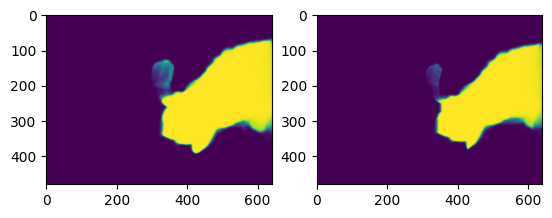

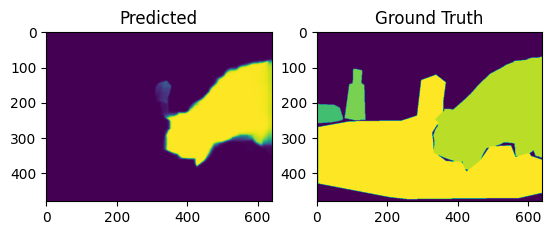

Processing Images:  42%|████▏     | 208/500 [01:55<02:53,  1.69it/s]

[1]
[3]
SPRC: nan


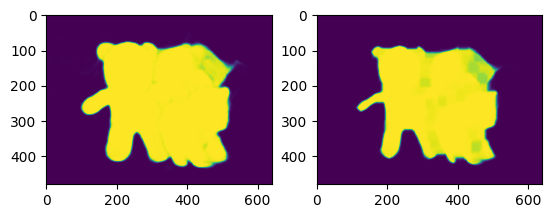

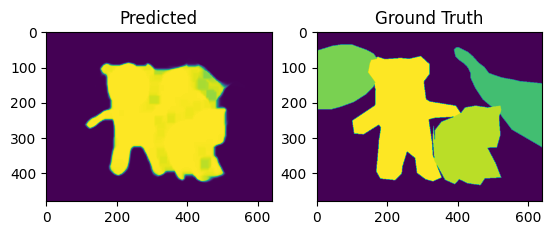

Processing Images:  42%|████▏     | 209/500 [01:56<02:50,  1.71it/s]

[1]
[4]
SPRC: nan


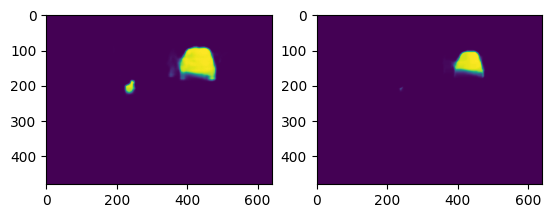

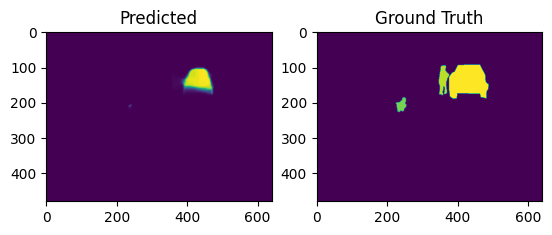

Processing Images:  42%|████▏     | 210/500 [01:56<02:49,  1.71it/s]

[1, 2]
[3, 1]
SPRC: 5.551115123125783e-17


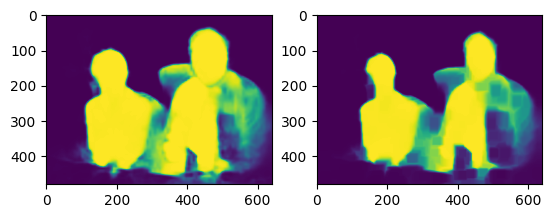

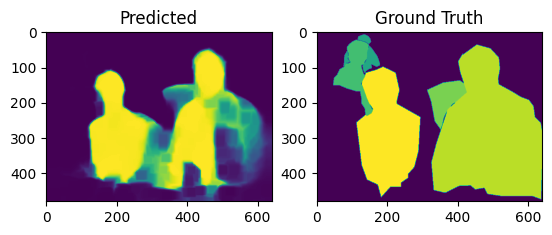

Processing Images:  42%|████▏     | 211/500 [01:57<03:10,  1.52it/s]

[1]
[3]
SPRC: nan


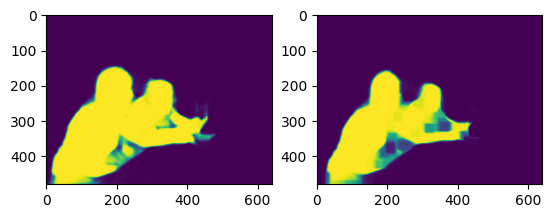

Processing Images:  42%|████▏     | 211/500 [01:58<02:42,  1.78it/s]


KeyboardInterrupt: 

In [175]:
# Find matching images
gt_images_path = os.listdir(GT_PATH)
pred_images_path = os.listdir(PRED_PATH)

# Load images
gt_images = []
pred_images = []

for im in pred_images_path:
    try:
        # Open as GRAY
        gt_images.append(Image.open(GT_PATH + im))
        pred_images.append(Image.open(PRED_PATH + im))
    except:
        pass

# Calculate SA-SOR, MAE
mae = []
sor = []
sa_sor = []

for i in tqdm(range(500), desc="Processing Images"):
    gt = np.array(gt_images[i])
    pred = np.array(pred_images[i])
    
    # Convert to GRAY
    pred = cv2.cvtColor(pred, cv2.COLOR_RGBA2GRAY)
    gt = cv2.cvtColor(gt, cv2.COLOR_RGB2GRAY)
    
    # mae += [calculate_mae(pred, gt)]

    calc_sor = calculate_sor(pred, gt)

    if calc_sor != None and not np.isnan(calc_sor):
        sor += [calc_sor]

    # sa_sor += [calculate_sa_sor(pred, gt)]


print(f"SOR: {np.mean(sor)}")
# print(f"SA-SOR: {np.mean(sa_sor)}")
# print(f"MAE: {np.mean(mae)}")